In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/pima-indians-diabetes-database/diabetes.csv


# Reading Data

In [2]:
df = pd.read_csv('../input/pima-indians-diabetes-database/diabetes.csv')
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [4]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


hummm! min value of some attributes is zero however we know it's impossible; for example,blood pressure or BMI values can not be zero. So, we can understand miss values fill with 0 before and this will have bad consequences!

# EDA

In [5]:
import plotly 
import plotly.express as px

In [6]:
px.histogram(df, x='Pregnancies', color="Outcome", width=350, height=250)

In [7]:
px.histogram(df, x='Glucose', color="Outcome", width=350, height=250)

In [8]:
px.histogram(df, x='BloodPressure', color="Outcome", width=350, height=250)

In [9]:
px.histogram(df, x='SkinThickness', color="Outcome", width=350, height=250)

In [10]:
px.histogram(df, x='Insulin', color="Outcome", width=350, height=250)

In [11]:
px.histogram(df, x='BMI', color="Outcome", width=350, height=250)

In [12]:
px.histogram(df, x='DiabetesPedigreeFunction', color="Outcome", width=350, height=250)

In [13]:
px.histogram(df, x='Age', color="Outcome", width=350, height=250)

# Preprocessing

In [14]:
X = df.drop(["Outcome"], axis=1)
y = df['Outcome']

In [15]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X = scaler.fit_transform(X)

In [16]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, np.array(y), test_size=0.2, random_state=42)

# Logistic Regression

Since there are many hyperparameters for each algorithm, we're going to use GridSearchCV tuner to find the best values for the hyperparameters. You can use RandomizedSearchCV too

In [17]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

LR_model = LogisticRegression(random_state=42)
LR_model_params = {
    'solver': ['lbfgs', 'newton-cg', 'liblinear', 'sag', 'saga'],
    'penalty': ['l1', 'l2', 'elasticnet', None],
    'C': list(np.random.random_sample((5,))),
    "class_weight": ['balanced', None],
    "warm_start": [True, False]
}

LR_GS = GridSearchCV(LR_model,
                     LR_model_params,
                     scoring = ["accuracy", "f1"],
                     refit = "f1",
                     cv = 5,
                     verbose = 4)

LR_GS.fit(X_train, y_train)

Fitting 5 folds for each of 400 candidates, totalling 2000 fits
[CV] C=0.9505361908075065, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=True 
[CV]  C=0.9505361908075065, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.9505361908075065, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=True 
[CV]  C=0.9505361908075065, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.9505361908075065, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=True 
[CV]  C=0.9505361908075065, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.9505361908075065, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=True 
[CV]  C=0.9505361908075065, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.9505361908075065, class_weight=bala

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: 

[CV]  C=0.9505361908075065, class_weight=balanced, penalty=l2, solver=lbfgs, warm_start=False, accuracy=0.756, f1=0.667, total=   0.0s
[CV] C=0.9505361908075065, class_weight=balanced, penalty=l2, solver=lbfgs, warm_start=False 
[CV]  C=0.9505361908075065, class_weight=balanced, penalty=l2, solver=lbfgs, warm_start=False, accuracy=0.746, f1=0.667, total=   0.0s
[CV] C=0.9505361908075065, class_weight=balanced, penalty=l2, solver=newton-cg, warm_start=True 
[CV]  C=0.9505361908075065, class_weight=balanced, penalty=l2, solver=newton-cg, warm_start=True, accuracy=0.756, f1=0.674, total=   0.0s
[CV] C=0.9505361908075065, class_weight=balanced, penalty=l2, solver=newton-cg, warm_start=True 
[CV]  C=0.9505361908075065, class_weight=balanced, penalty=l2, solver=newton-cg, warm_start=True, accuracy=0.797, f1=0.719, total=   0.0s
[CV] C=0.9505361908075065, class_weight=balanced, penalty=l2, solver=newton-cg, warm_start=True 
[CV]  C=0.9505361908075065, class_weight=balanced, penalty=l2, solver

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet penalty.


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV]  C=0.9505361908075065, class_weight=None, penalty=l1, solver=saga, warm_start=True, accuracy=0.805, f1=0.684, total=   0.0s
[CV] C=0.9505361908075065, class_weight=None, penalty=l1, solver=saga, warm_start=True 
[CV]  C=0.9505361908075065, class_weight=None, penalty=l1, solver=saga, warm_start=True, accuracy=0.732, f1=0.560, total=   0.0s
[CV] C=0.9505361908075065, class_weight=None, penalty=l1, solver=saga, warm_start=True 
[CV]  C=0.9505361908075065, class_weight=None, penalty=l1, solver=saga, warm_start=True, accuracy=0.732, f1=0.548, total=   0.0s
[CV] C=0.9505361908075065, class_weight=None, penalty=l1, solver=saga, warm_start=True 
[CV]  C=0.9505361908075065, class_weight=None, penalty=l1, solver=saga, warm_start=True, accuracy=0.787, f1=0.658, total=   0.0s
[CV] C=0.9505361908075065, class_weight=None, penalty=l1, solver=saga, warm_start=False 
[CV]  C=0.9505361908075065, class_weight=None, penalty=l1, solver=saga, warm_start=False, accuracy=0.756, f1=0.634, total=   0.0s
[

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet penalty.


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV] C=0.14782183585410547, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=True 
[CV]  C=0.14782183585410547, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.14782183585410547, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=True 
[CV]  C=0.14782183585410547, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.14782183585410547, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=False 
[CV]  C=0.14782183585410547, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.14782183585410547, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=False 
[CV]  C=0.14782183585410547, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.14782183585410547, class_weight=balanced, penalty=l1, solver=lbfgs, warm_start=False 
[

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet penalty.


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV]  C=0.14782183585410547, class_weight=balanced, penalty=elasticnet, solver=lbfgs, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.14782183585410547, class_weight=balanced, penalty=elasticnet, solver=lbfgs, warm_start=False 
[CV]  C=0.14782183585410547, class_weight=balanced, penalty=elasticnet, solver=lbfgs, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.14782183585410547, class_weight=balanced, penalty=elasticnet, solver=lbfgs, warm_start=False 
[CV]  C=0.14782183585410547, class_weight=balanced, penalty=elasticnet, solver=lbfgs, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.14782183585410547, class_weight=balanced, penalty=elasticnet, solver=lbfgs, warm_start=False 
[CV]  C=0.14782183585410547, class_weight=balanced, penalty=elasticnet, solver=lbfgs, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.14782183585410547, class_weight=balanced, penalty=elasticnet, solver=newton-cg, warm_start=True 
[CV]  C=0.147821835854105

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet penalty.


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV]  C=0.503557347621036, class_weight=balanced, penalty=l1, solver=newton-cg, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.503557347621036, class_weight=balanced, penalty=l1, solver=liblinear, warm_start=True 
[CV]  C=0.503557347621036, class_weight=balanced, penalty=l1, solver=liblinear, warm_start=True, accuracy=0.756, f1=0.674, total=   0.0s
[CV] C=0.503557347621036, class_weight=balanced, penalty=l1, solver=liblinear, warm_start=True 
[CV]  C=0.503557347621036, class_weight=balanced, penalty=l1, solver=liblinear, warm_start=True, accuracy=0.797, f1=0.719, total=   0.0s
[CV] C=0.503557347621036, class_weight=balanced, penalty=l1, solver=liblinear, warm_start=True 
[CV]  C=0.503557347621036, class_weight=balanced, penalty=l1, solver=liblinear, warm_start=True, accuracy=0.740, f1=0.673, total=   0.0s
[CV] C=0.503557347621036, class_weight=balanced, penalty=l1, solver=liblinear, warm_start=True 
[CV]  C=0.503557347621036, class_weight=balanced, penalty=l1, solver=li

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet penalty.


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV]  C=0.503557347621036, class_weight=balanced, penalty=elasticnet, solver=lbfgs, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.503557347621036, class_weight=balanced, penalty=elasticnet, solver=lbfgs, warm_start=True 
[CV]  C=0.503557347621036, class_weight=balanced, penalty=elasticnet, solver=lbfgs, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.503557347621036, class_weight=balanced, penalty=elasticnet, solver=lbfgs, warm_start=True 
[CV]  C=0.503557347621036, class_weight=balanced, penalty=elasticnet, solver=lbfgs, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.503557347621036, class_weight=balanced, penalty=elasticnet, solver=lbfgs, warm_start=False 
[CV]  C=0.503557347621036, class_weight=balanced, penalty=elasticnet, solver=lbfgs, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.503557347621036, class_weight=balanced, penalty=elasticnet, solver=lbfgs, warm_start=False 
[CV]  C=0.503557347621036, class_weight=balanced,

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet penalty.


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV]  C=0.05756838320428459, class_weight=balanced, penalty=l1, solver=liblinear, warm_start=True, accuracy=0.756, f1=0.688, total=   0.0s
[CV] C=0.05756838320428459, class_weight=balanced, penalty=l1, solver=liblinear, warm_start=True 
[CV]  C=0.05756838320428459, class_weight=balanced, penalty=l1, solver=liblinear, warm_start=True, accuracy=0.748, f1=0.699, total=   0.0s
[CV] C=0.05756838320428459, class_weight=balanced, penalty=l1, solver=liblinear, warm_start=True 
[CV]  C=0.05756838320428459, class_weight=balanced, penalty=l1, solver=liblinear, warm_start=True, accuracy=0.724, f1=0.646, total=   0.0s
[CV] C=0.05756838320428459, class_weight=balanced, penalty=l1, solver=liblinear, warm_start=True 
[CV]  C=0.05756838320428459, class_weight=balanced, penalty=l1, solver=liblinear, warm_start=True, accuracy=0.754, f1=0.694, total=   0.0s
[CV] C=0.05756838320428459, class_weight=balanced, penalty=l1, solver=liblinear, warm_start=False 
[CV]  C=0.05756838320428459, class_weight=balanced,

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet penalty.


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa


[CV] C=0.05756838320428459, class_weight=balanced, penalty=None, solver=lbfgs, warm_start=True 
[CV]  C=0.05756838320428459, class_weight=balanced, penalty=None, solver=lbfgs, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.05756838320428459, class_weight=balanced, penalty=None, solver=lbfgs, warm_start=True 
[CV]  C=0.05756838320428459, class_weight=balanced, penalty=None, solver=lbfgs, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.05756838320428459, class_weight=balanced, penalty=None, solver=lbfgs, warm_start=True 
[CV]  C=0.05756838320428459, class_weight=balanced, penalty=None, solver=lbfgs, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.05756838320428459, class_weight=balanced, penalty=None, solver=lbfgs, warm_start=True 
[CV]  C=0.05756838320428459, class_weight=balanced, penalty=None, solver=lbfgs, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.05756838320428459, class_weight=balanced, penalty=None, solver=lbfgs, warm

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet penalty.


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV]  C=0.053941823402721134, class_weight=balanced, penalty=l1, solver=saga, warm_start=True, accuracy=0.746, f1=0.644, total=   0.0s
[CV] C=0.053941823402721134, class_weight=balanced, penalty=l1, solver=saga, warm_start=False 
[CV]  C=0.053941823402721134, class_weight=balanced, penalty=l1, solver=saga, warm_start=False, accuracy=0.707, f1=0.609, total=   0.0s
[CV] C=0.053941823402721134, class_weight=balanced, penalty=l1, solver=saga, warm_start=False 
[CV]  C=0.053941823402721134, class_weight=balanced, penalty=l1, solver=saga, warm_start=False, accuracy=0.797, f1=0.719, total=   0.0s
[CV] C=0.053941823402721134, class_weight=balanced, penalty=l1, solver=saga, warm_start=False 
[CV]  C=0.053941823402721134, class_weight=balanced, penalty=l1, solver=saga, warm_start=False, accuracy=0.724, f1=0.660, total=   0.0s
[CV] C=0.053941823402721134, class_weight=balanced, penalty=l1, solver=saga, warm_start=False 
[CV]  C=0.053941823402721134, class_weight=balanced, penalty=l1, solver=saga,

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet penalty.


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV]  C=0.053941823402721134, class_weight=None, penalty=l1, solver=newton-cg, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.053941823402721134, class_weight=None, penalty=l1, solver=newton-cg, warm_start=True 
[CV]  C=0.053941823402721134, class_weight=None, penalty=l1, solver=newton-cg, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.053941823402721134, class_weight=None, penalty=l1, solver=newton-cg, warm_start=False 
[CV]  C=0.053941823402721134, class_weight=None, penalty=l1, solver=newton-cg, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.053941823402721134, class_weight=None, penalty=l1, solver=newton-cg, warm_start=False 
[CV]  C=0.053941823402721134, class_weight=None, penalty=l1, solver=newton-cg, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] C=0.053941823402721134, class_weight=None, penalty=l1, solver=newton-cg, warm_start=False 
[CV]  C=0.053941823402721134, class_weight=None, penalty=l1, solver=newton-cg, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet penalty.


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

GridSearchCV(cv=5, estimator=LogisticRegression(random_state=42),
             param_grid={'C': [0.9505361908075065, 0.14782183585410547,
                               0.503557347621036, 0.05756838320428459,
                               0.053941823402721134],
                         'class_weight': ['balanced', None],
                         'penalty': ['l1', 'l2', 'elasticnet', None],
                         'solver': ['lbfgs', 'newton-cg', 'liblinear', 'sag',
                                    'saga'],
                         'warm_start': [True, False]},
             refit='f1', scoring=['accuracy', 'f1'], verbose=4)

Let's see what are the best hyperparameters found by GridSearchCV

In [18]:
print(LR_GS.best_params_)
print(LR_GS.best_score_)

{'C': 0.053941823402721134, 'class_weight': 'balanced', 'penalty': 'l2', 'solver': 'liblinear', 'warm_start': True}
0.682350322849443


It is better to save the details of each model in a Pandas DataFrame so that we can evaluate them later. I have sorted them based on the best F1 score.

In [19]:
LR_models_df = pd.DataFrame(LR_GS.cv_results_)
LR_models_df = LR_models_df.sort_values("rank_test_f1")
LR_models_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_class_weight,param_penalty,param_solver,param_warm_start,params,...,std_test_accuracy,rank_test_accuracy,split0_test_f1,split1_test_f1,split2_test_f1,split3_test_f1,split4_test_f1,mean_test_f1,std_test_f1,rank_test_f1
334,0.002291,0.000342,0.001055,0.000092,0.053942,balanced,l2,liblinear,True,"{'C': 0.053941823402721134, 'class_weight': 'b...",...,0.020394,101,0.659574,0.725275,0.693878,0.659341,0.673684,0.682350,0.024894,1
335,0.001962,0.000244,0.000937,0.000053,0.053942,balanced,l2,liblinear,False,"{'C': 0.053941823402721134, 'class_weight': 'b...",...,0.020394,101,0.659574,0.725275,0.693878,0.659341,0.673684,0.682350,0.024894,1
94,0.002373,0.000346,0.001017,0.000059,0.147822,balanced,l2,liblinear,True,"{'C': 0.14782183585410547, 'class_weight': 'ba...",...,0.018563,59,0.673913,0.719101,0.680412,0.666667,0.666667,0.681352,0.019558,3
95,0.002129,0.000203,0.001016,0.000123,0.147822,balanced,l2,liblinear,False,"{'C': 0.14782183585410547, 'class_weight': 'ba...",...,0.018563,59,0.673913,0.719101,0.680412,0.666667,0.666667,0.681352,0.019558,3
175,0.002299,0.000330,0.001058,0.000067,0.503557,balanced,l2,liblinear,False,"{'C': 0.503557347621036, 'class_weight': 'bala...",...,0.019902,81,0.673913,0.719101,0.673469,0.666667,0.666667,0.679963,0.019820,5


In fact, loss and accuracy values can not describe our model truly! So we use 'classification_report' function from sklearn to get Precision, Recall & F1 Scores which express the model better.

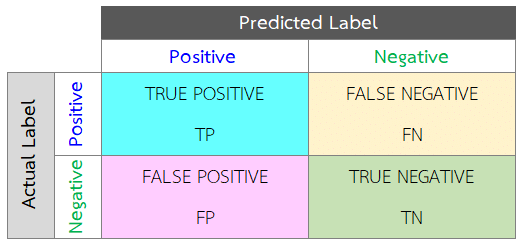

**Precision:**

Precision is the ratio of correctly predicted positive observations to the total predicted positive observations. The question 'precision' answers is: Of all patients that labeled as covid, how many actually covid patient?

Precision = TP / TP+FP

**Recall:**

Recall is the ratio of correctly predicted positive observations to the all observations in actual class - yes. The question 'recall' answers is: Of all the patients that truly have covid, how many did we label?

Recall = TP / TP+FN

**F1 score:**

F1 Score is the weighted average of 'precision' and 'recall'. Therefore, this score takes both false positives and false negatives into account. Intuitively it is not as easy to understand as accuracy, but F1 is usually more useful than accuracy

F1 Score = 2(Recall Precision) / (Recall + Precision)

In [20]:
from sklearn.metrics import classification_report

model_pred = LR_GS.predict(X_test)
LR_classifier_report = classification_report(y_test, model_pred, output_dict=True)
LR_results = pd.DataFrame(LR_classifier_report).transpose()
LR_results

,precision,recall,f1-score,support
0,0.817073,0.676768,0.740331,99.000000
1,0.555556,0.727273,0.629921,55.000000
accuracy,0.694805,0.694805,0.694805,0.694805
macro avg,0.686314,0.702020,0.685126,154.000000
weighted avg,0.723674,0.694805,0.700899,154.000000


# SVM

In [21]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

svm_model = SVC(random_state=42)
svm_model_params = {'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
                    'gamma': list(np.random.random_sample((10,))), 
                    'degree': [2,3,4],
                    'C': list(np.random.random_sample((10,))),
                   }

svm_GS = GridSearchCV(svm_model,
                      svm_model_params,
                      scoring = ["accuracy", "f1"],
                      refit = "f1",
                      cv = 5,
                      verbose = 4)

svm_GS.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 1200 candidates, totalling 6000 fits
[CV] C=0.48156027662486967, degree=2, gamma=0.10564585406418048, kernel=linear 
[CV]  C=0.48156027662486967, degree=2, gamma=0.10564585406418048, kernel=linear, accuracy=0.756, f1=0.634, total=   0.0s
[CV] C=0.48156027662486967, degree=2, gamma=0.10564585406418048, kernel=linear 
[CV]  C=0.48156027662486967, degree=2, gamma=0.10564585406418048, kernel=linear, accuracy=0.805, f1=0.684, total=   0.0s
[CV] C=0.48156027662486967, degree=2, gamma=0.10564585406418048, kernel=linear 
[CV]  C=0.48156027662486967, degree=2, gamma=0.10564585406418048, kernel=linear, accuracy=0.756, f1=0.595, total=   0.0s
[CV] C=0.48156027662486967, degree=2, gamma=0.10564585406418048, kernel=linear 
[CV]  C=0.48156027662486967, degree=2, gamma=0.10564585406418048, kernel=linear, accuracy=0.732, f1=0.548, total=   0.0s
[CV] C=0.48156027662486967, degree=2, gamma=0.10564585406418048, kernel=linear 
[CV]  C=0.48156027662486967, degree=2, gamma=0.1056

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s


[CV]  C=0.48156027662486967, degree=2, gamma=0.42388934854734794, kernel=linear, accuracy=0.779, f1=0.649, total=   0.0s
[CV] C=0.48156027662486967, degree=2, gamma=0.42388934854734794, kernel=rbf 
[CV]  C=0.48156027662486967, degree=2, gamma=0.42388934854734794, kernel=rbf, accuracy=0.732, f1=0.522, total=   0.0s
[CV] C=0.48156027662486967, degree=2, gamma=0.42388934854734794, kernel=rbf 
[CV]  C=0.48156027662486967, degree=2, gamma=0.42388934854734794, kernel=rbf, accuracy=0.789, f1=0.639, total=   0.0s
[CV] C=0.48156027662486967, degree=2, gamma=0.42388934854734794, kernel=rbf 
[CV]  C=0.48156027662486967, degree=2, gamma=0.42388934854734794, kernel=rbf, accuracy=0.724, f1=0.528, total=   0.0s
[CV] C=0.48156027662486967, degree=2, gamma=0.42388934854734794, kernel=rbf 
[CV]  C=0.48156027662486967, degree=2, gamma=0.42388934854734794, kernel=rbf, accuracy=0.764, f1=0.567, total=   0.0s
[CV] C=0.48156027662486967, degree=2, gamma=0.42388934854734794, kernel=rbf 
[CV]  C=0.481560276624

[Parallel(n_jobs=1)]: Done 6000 out of 6000 | elapsed:  2.2min finished


GridSearchCV(cv=5, estimator=SVC(random_state=42),
             param_grid={'C': [0.48156027662486967, 0.7702759072286294,
                               0.1142486272562464, 0.1780761255462957,
                               0.7347168427113153, 0.713240510337438,
                               0.9109283534846011, 0.6922144024391191,
                               0.5259791758533638, 0.9145218676993984],
                         'degree': [2, 3, 4],
                         'gamma': [0.10564585406418048, 0.42388934854734794,
                                   0.9159845552181358, 0.34507849481438335,
                                   0.1687340303385435, 0.6947268756908184,
                                   0.8806714620308241, 0.4300849837796916,
                                   0.9413419145515934, 0.2845466613580274],
                         'kernel': ['linear', 'rbf', 'poly', 'sigmoid']},
             refit='f1', scoring=['accuracy', 'f1'], verbose=4)

In [22]:
print(svm_GS.best_params_)
print(svm_GS.best_score_)

{'C': 0.9109283534846011, 'degree': 2, 'gamma': 0.1687340303385435, 'kernel': 'rbf'}
0.6425208693461663


In [23]:
svm_models_df = pd.DataFrame(svm_GS.cv_results_)
svm_models_df = svm_models_df.sort_values("rank_test_f1")
svm_models_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_degree,param_gamma,param_kernel,params,split0_test_accuracy,...,std_test_accuracy,rank_test_accuracy,split0_test_f1,split1_test_f1,split2_test_f1,split3_test_f1,split4_test_f1,mean_test_f1,std_test_f1,rank_test_f1
817,0.005236,0.000280,0.001733,0.000347,0.910928,4,0.168734,rbf,"{'C': 0.9109283534846011, 'degree': 4, 'gamma'...",0.780488,...,0.031078,4,0.674699,0.725,0.552632,0.630137,0.630137,0.642521,0.056965,1
1177,0.005437,0.000142,0.001698,0.000068,0.914522,4,0.168734,rbf,"{'C': 0.9145218676993984, 'degree': 4, 'gamma'...",0.780488,...,0.031078,4,0.674699,0.725,0.552632,0.630137,0.630137,0.642521,0.056965,1
737,0.005776,0.000314,0.001859,0.000039,0.910928,2,0.168734,rbf,"{'C': 0.9109283534846011, 'degree': 2, 'gamma'...",0.780488,...,0.031078,4,0.674699,0.725,0.552632,0.630137,0.630137,0.642521,0.056965,1
1137,0.005638,0.000286,0.001656,0.000046,0.914522,3,0.168734,rbf,"{'C': 0.9145218676993984, 'degree': 3, 'gamma'...",0.780488,...,0.031078,4,0.674699,0.725,0.552632,0.630137,0.630137,0.642521,0.056965,1
1097,0.005683,0.000237,0.001671,0.000100,0.914522,2,0.168734,rbf,"{'C': 0.9145218676993984, 'degree': 2, 'gamma'...",0.780488,...,0.031078,4,0.674699,0.725,0.552632,0.630137,0.630137,0.642521,0.056965,1


In [24]:
model_pred = svm_GS.predict(X_test)
svm_classifier_report = classification_report(y_test, model_pred , output_dict=True)
svm_results = pd.DataFrame(svm_classifier_report).transpose()
svm_results

,precision,recall,f1-score,support
0,0.768519,0.838384,0.801932,99.000000
1,0.652174,0.545455,0.594059,55.000000
accuracy,0.733766,0.733766,0.733766,0.733766
macro avg,0.710346,0.691919,0.697996,154.000000
weighted avg,0.726967,0.733766,0.727692,154.000000


# Random Forest

In [25]:
from sklearn.ensemble import RandomForestClassifier

RF_model = RandomForestClassifier(random_state=42)
RF_search_space = {
    "n_estimators": [100, 200, 400, 500],
    "criterion": ['gini', 'entropy', 'log_loss'],
    "max_features": ['sqrt', None],
    "class_weight": ['balanced', 'balanced_subsample', None],
    "max_depth": [5, 6, 7, 8],
    "bootstrap": [True, False],
    "oob_score": [True, False],
    "warm_start": [True, False]
}

RF_GS = GridSearchCV(estimator = RF_model,
                     param_grid = RF_search_space,
                     scoring = ["accuracy", "f1"],
                     refit = "f1",
                     cv = 5,
                     verbose = 4)

RF_GS.fit(X_train, y_train)

Fitting 5 folds for each of 2304 candidates, totalling 11520 fits
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.772, f1=0.702, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y yo

[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.772, f1=0.714, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s remaining:    0.0s
/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s remaining:    0.0s
/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you

[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.724, f1=0.605, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.770, f1=0.689, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.772, f1=0.702, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.772, f1=0.714, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.772, f1=0.714, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.605, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.770, f1=0.689, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.772, f1=0.702, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.789, f1=0.711, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.772, f1=0.714, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  b

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.772, f1=0.702, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.797, f1=0.719, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.772, f1=0.714, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.715, f1=0.588, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.779, f1=0.703, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.772, f1=0.702, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.797, f1=0.719, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.702, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.797, f1=0.719, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.714, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.715, f1=0.588, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.779, f1=0.703, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.772, f1=0.702, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.797, f1=0.719, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.772, f1=0.702, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.797, f1=0.719, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.772, f1=0.714, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.724, f1=0.605, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.779, f1=0.703, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.772, f1=0.702, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.797, f1=0.719, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.702, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.719, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.714, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.605, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.779, f1=0.703, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.772, f1=0.702, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.797, f1=0.719, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.716, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.797, f1=0.719, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.764, f1=0.707, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.732, f1=0.621, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.770, f1=0.696, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.780, f1=0.716, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.797, f1=0.719, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.797, f1=0.719, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.707, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.732, f1=0.621, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.770, f1=0.696, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.797, f1=0.719, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.764, f1=0.695, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.764, f1=0.688, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.772, f1=0.708, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.715, f1=0.588, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.738, f1=0.644, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.764, f1=0.695, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.764, f1=0.688, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.764, f1=0.695, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.764, f1=0.688, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.772, f1=0.708, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.715, f1=0.588, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.738, f1=0.644, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.764, f1=0.695, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.764, f1=0.688, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.740, f1=0.673, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.772, f1=0.696, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.789, f1=0.729, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.707, f1=0.571, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.738, f1=0.644, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.740, f1=0.673, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.772, f1=0.696, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.673, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.696, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.729, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.707, f1=0.571, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.738, f1=0.644, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.740, f1=0.673, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.772, f1=0.696, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.732, f1=0.667, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.703, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.716, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.707, f1=0.571, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.746, f1=0.652, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.732, f1=0.667, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.780, f1=0.703, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.732, f1=0.667, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.703, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.707, f1=0.571, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.746, f1=0.652, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.732, f1=0.667, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.703, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.732, f1=0.667, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.797, f1=0.731, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.789, f1=0.723, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.707, f1=0.571, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.738, f1=0.644, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.732, f1=0.667, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.797, f1=0.731, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.732, f1=0.667, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.797, f1=0.731, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.789, f1=0.723, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.707, f1=0.571, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.738, f1=0.644, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.732, f1=0.667, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.797, f1=0.731, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.805, f1=0.733, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.772, f1=0.702, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.724, f1=0.605, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.770, f1=0.696, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.740, f1=0.660, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.805, f1=0.733, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.772, f1=0.702, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.805, f1=0.733, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.772, f1=0.702, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.605, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.770, f1=0.696, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.740, f1=0.660, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.805, f1=0.733, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.772, f1=0.702, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  b

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.780, f1=0.710, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.821, f1=0.756, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.748, f1=0.667, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.715, f1=0.588, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.762, f1=0.688, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.780, f1=0.710, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.821, f1=0.756, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.821, f1=0.756, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.715, f1=0.588, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.762, f1=0.688, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.821, f1=0.756, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.710, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.813, f1=0.736, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.748, f1=0.659, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.707, f1=0.571, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.754, f1=0.674, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.780, f1=0.710, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.813, f1=0.736, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.813, f1=0.736, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.707, f1=0.571, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.754, f1=0.674, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.813, f1=0.736, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.772, f1=0.702, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.813, f1=0.736, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.748, f1=0.659, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.707, f1=0.571, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.754, f1=0.674, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.772, f1=0.702, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.813, f1=0.736, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.702, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.813, f1=0.736, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.707, f1=0.571, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.754, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.772, f1=0.702, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.813, f1=0.736, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.764, f1=0.688, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.805, f1=0.727, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.756, f1=0.674, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.715, f1=0.578, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.713, f1=0.578, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.764, f1=0.688, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.805, f1=0.727, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.764, f1=0.688, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.805, f1=0.727, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.715, f1=0.578, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.713, f1=0.578, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.764, f1=0.688, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.805, f1=0.727, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.764, f1=0.695, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.789, f1=0.711, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.780, f1=0.710, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.715, f1=0.588, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.730, f1=0.621, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.764, f1=0.695, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.789, f1=0.711, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.695, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.711, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.715, f1=0.588, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.730, f1=0.621, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.764, f1=0.695, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.789, f1=0.711, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.748, f1=0.680, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.797, f1=0.719, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.772, f1=0.689, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.707, f1=0.561, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.721, f1=0.614, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.748, f1=0.680, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.797, f1=0.719, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.719, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.689, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.707, f1=0.561, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.721, f1=0.614, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.748, f1=0.680, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.797, f1=0.719, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.740, f1=0.667, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.789, f1=0.711, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.764, f1=0.681, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.707, f1=0.561, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.721, f1=0.614, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.740, f1=0.667, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.789, f1=0.711, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.667, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.789, f1=0.711, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.681, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.707, f1=0.561, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.721, f1=0.614, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.740, f1=0.667, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.789, f1=0.711, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.789, f1=0.705, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.732, f1=0.629, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.740, f1=0.610, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.762, f1=0.667, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.756, f1=0.674, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.789, f1=0.705, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.789, f1=0.705, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.629, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.762, f1=0.667, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.674, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.789, f1=0.705, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.772, f1=0.696, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.805, f1=0.727, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.756, f1=0.667, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.740, f1=0.610, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.746, f1=0.659, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.772, f1=0.696, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.805, f1=0.727, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.696, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.805, f1=0.727, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.746, f1=0.659, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.772, f1=0.696, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.805, f1=0.727, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.764, f1=0.681, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.805, f1=0.721, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.740, f1=0.644, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.724, f1=0.585, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.762, f1=0.681, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.764, f1=0.681, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.805, f1=0.721, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.681, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.805, f1=0.721, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.644, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.585, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.762, f1=0.681, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.764, f1=0.681, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.805, f1=0.721, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.764, f1=0.674, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.805, f1=0.721, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.748, f1=0.659, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.724, f1=0.575, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.754, f1=0.674, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.764, f1=0.674, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.805, f1=0.721, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.805, f1=0.721, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.575, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.754, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.764, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.805, f1=0.721, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.780, f1=0.697, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.797, f1=0.713, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.772, f1=0.689, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.715, f1=0.578, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.713, f1=0.568, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.780, f1=0.697, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.797, f1=0.713, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.697, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.797, f1=0.713, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.772, f1=0.689, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.715, f1=0.578, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.713, f1=0.568, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.697, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.797, f1=0.713, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.780, f1=0.697, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.805, f1=0.721, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.780, f1=0.703, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.732, f1=0.602, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.746, f1=0.608, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.780, f1=0.697, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.805, f1=0.721, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.697, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.805, f1=0.721, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.703, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.746, f1=0.608, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.780, f1=0.697, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.805, f1=0.721, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.690, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.797, f1=0.713, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.764, f1=0.674, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.724, f1=0.585, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.738, f1=0.610, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.780, f1=0.690, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.797, f1=0.713, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.690, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.713, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.674, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.585, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.738, f1=0.610, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.690, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.797, f1=0.713, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.772, f1=0.682, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.797, f1=0.713, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.703, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.724, f1=0.585, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.730, f1=0.602, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.772, f1=0.682, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.797, f1=0.713, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.682, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.797, f1=0.713, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.703, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.585, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.730, f1=0.602, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.772, f1=0.682, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.797, f1=0.713, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.821, f1=0.738, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.740, f1=0.644, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.764, f1=0.623, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.787, f1=0.683, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.756, f1=0.651, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.821, f1=0.738, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.740, f1=0.644, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.821, f1=0.738, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.644, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.764, f1=0.623, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.787, f1=0.683, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.651, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.821, f1=0.738, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.740, f1=0.644, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  b

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.772, f1=0.674, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.837, f1=0.767, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.748, f1=0.659, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.732, f1=0.582, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.762, f1=0.642, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.772, f1=0.674, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.837, f1=0.767, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.674, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.837, f1=0.767, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.582, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.762, f1=0.642, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.772, f1=0.674, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.837, f1=0.767, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.764, f1=0.659, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.813, f1=0.729, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.740, f1=0.644, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.740, f1=0.590, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.787, f1=0.690, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.764, f1=0.659, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.813, f1=0.729, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.659, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.644, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.590, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.787, f1=0.690, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.764, f1=0.659, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.813, f1=0.729, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.764, f1=0.667, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.813, f1=0.729, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.740, f1=0.644, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.740, f1=0.579, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.770, f1=0.674, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.764, f1=0.667, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.813, f1=0.729, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.667, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.644, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.579, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.770, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.764, f1=0.667, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.813, f1=0.729, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.772, f1=0.682, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.780, f1=0.690, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.764, f1=0.667, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.715, f1=0.578, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.730, f1=0.571, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.772, f1=0.682, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.780, f1=0.690, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.772, f1=0.682, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.690, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.764, f1=0.667, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.715, f1=0.578, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.730, f1=0.571, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.772, f1=0.682, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.690, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.780, f1=0.690, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.813, f1=0.729, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.764, f1=0.674, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.732, f1=0.602, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.754, f1=0.605, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.780, f1=0.690, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.813, f1=0.729, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.690, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.674, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.754, f1=0.605, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.780, f1=0.690, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.813, f1=0.729, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.690, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.821, f1=0.738, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.756, f1=0.651, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.724, f1=0.585, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.738, f1=0.590, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.780, f1=0.690, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.821, f1=0.738, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.690, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.821, f1=0.738, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.651, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.585, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.738, f1=0.590, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.690, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.821, f1=0.738, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.690, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.813, f1=0.729, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.764, f1=0.667, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.732, f1=0.602, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.730, f1=0.582, total=   1.4s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.780, f1=0.690, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.813, f1=0.729, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.690, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.667, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.730, f1=0.582, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.690, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.813, f1=0.729, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.780, f1=0.710, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.772, f1=0.714, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.724, f1=0.605, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.754, f1=0.667, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.764, f1=0.681, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.780, f1=0.710, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.772, f1=0.714, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=Fa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.772, f1=0.714, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.605, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.754, f1=0.667, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.764, f1=0.681, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.772, f1=0.714, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_st

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.789, f1=0.723, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.789, f1=0.717, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.772, f1=0.720, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.715, f1=0.588, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.762, f1=0.681, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.789, f1=0.723, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.789, f1=0.717, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.723, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.720, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.715, f1=0.588, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.762, f1=0.681, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.789, f1=0.723, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.716, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.797, f1=0.725, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.727, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.715, f1=0.578, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.770, f1=0.696, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.780, f1=0.716, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.797, f1=0.725, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.725, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.727, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.715, f1=0.578, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.770, f1=0.696, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.797, f1=0.725, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.772, f1=0.708, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.710, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.764, f1=0.701, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.748, f1=0.644, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.770, f1=0.696, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.772, f1=0.708, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.780, f1=0.710, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.708, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.701, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.644, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.770, f1=0.696, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.772, f1=0.708, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.748, f1=0.674, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.780, f1=0.710, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.805, f1=0.755, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.738, f1=0.636, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.748, f1=0.674, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.780, f1=0.710, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.674, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.805, f1=0.755, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.738, f1=0.636, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.748, f1=0.674, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.756, f1=0.688, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.789, f1=0.717, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.789, f1=0.735, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.732, f1=0.612, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.738, f1=0.644, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.756, f1=0.688, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.789, f1=0.717, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.735, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.612, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.738, f1=0.644, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.756, f1=0.688, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.789, f1=0.717, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.722, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.746, f1=0.659, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.756, f1=0.688, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.789, f1=0.717, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.722, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.746, f1=0.659, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.756, f1=0.688, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.789, f1=0.717, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.716, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.738, f1=0.644, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.756, f1=0.688, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.789, f1=0.717, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.738, f1=0.644, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.724, f1=0.630, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.770, f1=0.696, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.797, f1=0.725, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.724, f1=0.630, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=Fa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.630, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.770, f1=0.696, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.797, f1=0.725, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.724, f1=0.630, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_st

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.772, f1=0.696, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.789, f1=0.711, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.748, f1=0.659, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.748, f1=0.644, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.770, f1=0.696, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.772, f1=0.696, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.789, f1=0.711, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.696, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.711, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.644, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.770, f1=0.696, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.772, f1=0.696, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.789, f1=0.711, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.756, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.805, f1=0.733, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.756, f1=0.681, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.748, f1=0.635, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.762, f1=0.688, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.756, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.805, f1=0.733, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.805, f1=0.733, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.681, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.635, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.762, f1=0.688, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.756, f1=0.674, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.805, f1=0.733, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.756, f1=0.674, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.813, f1=0.742, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.756, f1=0.681, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.732, f1=0.602, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.762, f1=0.688, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.756, f1=0.674, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.813, f1=0.742, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.813, f1=0.742, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.681, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.762, f1=0.688, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.756, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.813, f1=0.742, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.772, f1=0.696, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.797, f1=0.725, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.764, f1=0.695, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.738, f1=0.628, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.772, f1=0.696, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.797, f1=0.725, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.772, f1=0.696, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.797, f1=0.725, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.764, f1=0.695, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.738, f1=0.628, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.772, f1=0.696, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.797, f1=0.725, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.780, f1=0.703, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.780, f1=0.703, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.772, f1=0.708, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.715, f1=0.588, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.730, f1=0.621, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.780, f1=0.703, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.780, f1=0.703, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.703, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.703, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.708, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.715, f1=0.588, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.730, f1=0.621, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.780, f1=0.703, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.780, f1=0.703, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.772, f1=0.702, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.789, f1=0.711, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.748, f1=0.667, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.715, f1=0.588, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.738, f1=0.644, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.772, f1=0.702, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.789, f1=0.711, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.702, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.789, f1=0.711, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.715, f1=0.588, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.738, f1=0.644, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.772, f1=0.702, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.789, f1=0.711, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.710, total=   1.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.703, total=   1.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.764, f1=0.688, total=   1.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.715, f1=0.588, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.730, f1=0.629, total=   1.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.780, f1=0.710, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.780, f1=0.703, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.703, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.688, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.715, f1=0.588, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.730, f1=0.629, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.703, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.780, f1=0.710, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.797, f1=0.719, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.772, f1=0.708, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.715, f1=0.557, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.746, f1=0.652, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.780, f1=0.710, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.797, f1=0.719, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.797, f1=0.719, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.772, f1=0.708, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.715, f1=0.557, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.746, f1=0.652, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.797, f1=0.719, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.772, f1=0.708, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_st

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.780, f1=0.703, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.821, f1=0.750, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.772, f1=0.708, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.715, f1=0.568, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.762, f1=0.674, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.780, f1=0.703, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.821, f1=0.750, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.703, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.821, f1=0.750, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.708, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.715, f1=0.568, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.762, f1=0.674, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.780, f1=0.703, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.821, f1=0.750, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.772, f1=0.689, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.821, f1=0.750, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.756, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.724, f1=0.575, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.762, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.772, f1=0.689, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.821, f1=0.750, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.689, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.821, f1=0.750, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.575, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.762, f1=0.674, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.772, f1=0.689, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.821, f1=0.750, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.772, f1=0.689, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.829, f1=0.759, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.764, f1=0.688, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.724, f1=0.575, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.762, f1=0.674, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.772, f1=0.689, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.829, f1=0.759, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.689, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.829, f1=0.759, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.688, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.575, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.762, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.772, f1=0.689, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.829, f1=0.759, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.789, f1=0.711, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.797, f1=0.719, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.748, f1=0.659, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.748, f1=0.627, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.738, f1=0.619, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.789, f1=0.711, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.797, f1=0.719, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.789, f1=0.711, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.797, f1=0.719, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.627, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.738, f1=0.619, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.789, f1=0.711, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.797, f1=0.719, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.780, f1=0.697, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.789, f1=0.705, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.764, f1=0.674, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.738, f1=0.619, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.780, f1=0.697, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.789, f1=0.705, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.697, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.705, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.674, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.738, f1=0.619, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.780, f1=0.697, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.789, f1=0.705, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.697, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.789, f1=0.705, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.748, f1=0.652, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.713, f1=0.598, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.780, f1=0.697, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.789, f1=0.705, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.697, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.789, f1=0.705, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.652, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.713, f1=0.598, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.697, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.789, f1=0.705, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.789, f1=0.711, total=   1.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.789, f1=0.705, total=   1.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.764, f1=0.674, total=   1.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.732, f1=0.602, total=   1.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.721, f1=0.605, total=   1.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.789, f1=0.711, total=   1.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.789, f1=0.705, total=   1.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.789, f1=0.711, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.789, f1=0.705, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.674, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.721, f1=0.605, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.789, f1=0.711, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.789, f1=0.705, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.764, f1=0.659, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.829, f1=0.759, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.715, f1=0.624, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.732, f1=0.582, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.746, f1=0.627, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.764, f1=0.659, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.829, f1=0.759, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.829, f1=0.759, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.715, f1=0.624, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.582, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.746, f1=0.627, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.764, f1=0.659, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.829, f1=0.759, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.715, f1=0.624, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_st

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.764, f1=0.659, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.821, f1=0.750, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.748, f1=0.659, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.724, f1=0.575, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.754, f1=0.634, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.764, f1=0.659, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.821, f1=0.750, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.659, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.821, f1=0.750, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.575, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.754, f1=0.634, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.764, f1=0.659, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.821, f1=0.750, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.756, f1=0.651, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.821, f1=0.744, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.756, f1=0.667, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.740, f1=0.590, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.754, f1=0.634, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.756, f1=0.651, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.821, f1=0.744, total=   0.8s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.651, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.821, f1=0.744, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.590, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.754, f1=0.634, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.756, f1=0.651, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.821, f1=0.744, total=   0.7s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.756, f1=0.651, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.821, f1=0.744, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.748, f1=0.659, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.740, f1=0.590, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.754, f1=0.634, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.756, f1=0.651, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.821, f1=0.744, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.651, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.821, f1=0.744, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.590, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.754, f1=0.634, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.756, f1=0.651, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.821, f1=0.744, total=   0.9s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.789, f1=0.698, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.797, f1=0.719, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.732, f1=0.629, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.748, f1=0.617, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.738, f1=0.610, total=   0.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.789, f1=0.698, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.797, f1=0.719, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.789, f1=0.698, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.797, f1=0.719, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.629, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.617, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.738, f1=0.610, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.789, f1=0.698, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.797, f1=0.719, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.772, f1=0.682, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.805, f1=0.721, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.740, f1=0.636, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.748, f1=0.617, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.754, f1=0.634, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.772, f1=0.682, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.805, f1=0.721, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.682, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.805, f1=0.721, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.636, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.617, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.754, f1=0.634, total=   0.6s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.772, f1=0.682, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.805, f1=0.721, total=   0.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.690, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.797, f1=0.713, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.740, f1=0.636, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.740, f1=0.610, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.746, f1=0.627, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.780, f1=0.690, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.797, f1=0.713, total=   1.2s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.690, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.713, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.636, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   1.1s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.746, f1=0.627, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.690, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.797, f1=0.713, total=   1.0s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.690, total=   1.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.805, f1=0.721, total=   1.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.748, f1=0.644, total=   1.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.748, f1=0.617, total=   1.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.746, f1=0.627, total=   1.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.780, f1=0.690, total=   1.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.805, f1=0.721, total=   1.5s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.690, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.805, f1=0.721, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.644, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.617, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.746, f1=0.627, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.690, total=   1.3s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.805, f1=0.721, total=   1.4s
[CV] bootstrap=True, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=Tru

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV] 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=Tru

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV] 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=Tru

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV] 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=Tru

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV] 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=Tru

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV] 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=Tru

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV] 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=Tru

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV] 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=Tru

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.3s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.780, f1=0.716, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.780, f1=0.727, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.770, f1=0.696, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.780, f1=0.716, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.727, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.770, f1=0.696, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.727, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, 

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.780, f1=0.716, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.805, f1=0.727, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.764, f1=0.707, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.740, f1=0.628, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.779, f1=0.703, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.780, f1=0.716, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.805, f1=0.727, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.805, f1=0.727, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.707, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.628, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.779, f1=0.703, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.805, f1=0.727, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.772, f1=0.702, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.805, f1=0.727, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.764, f1=0.701, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.732, f1=0.621, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.770, f1=0.696, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.772, f1=0.702, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.805, f1=0.727, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.702, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.805, f1=0.727, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.701, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.732, f1=0.621, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.770, f1=0.696, total=   0.7s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.772, f1=0.702, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.805, f1=0.727, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.772, f1=0.702, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.797, f1=0.719, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.772, f1=0.714, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.732, f1=0.621, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.770, f1=0.696, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.772, f1=0.702, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.797, f1=0.719, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.702, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.797, f1=0.719, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.714, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.732, f1=0.621, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.770, f1=0.696, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.772, f1=0.702, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.797, f1=0.719, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.748, f1=0.680, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.780, f1=0.710, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.789, f1=0.723, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.715, f1=0.588, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.721, f1=0.614, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.748, f1=0.680, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.780, f1=0.710, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.789, f1=0.723, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.715, f1=0.588, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.721, f1=0.614, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.748, f1=0.680, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.732, f1=0.667, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.780, f1=0.710, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.789, f1=0.729, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.707, f1=0.571, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.746, f1=0.652, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.732, f1=0.667, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.780, f1=0.710, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.667, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.729, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.707, f1=0.571, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.746, f1=0.652, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.732, f1=0.667, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.732, f1=0.667, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.789, f1=0.717, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.789, f1=0.729, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.707, f1=0.571, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.738, f1=0.644, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.732, f1=0.667, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.789, f1=0.717, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.732, f1=0.667, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.789, f1=0.729, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.707, f1=0.571, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.738, f1=0.644, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.732, f1=0.667, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.732, f1=0.667, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.789, f1=0.717, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.716, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.707, f1=0.571, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.738, f1=0.644, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.732, f1=0.667, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.789, f1=0.717, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.732, f1=0.667, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.707, f1=0.571, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.738, f1=0.644, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.732, f1=0.667, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.813, f1=0.742, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.756, f1=0.681, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.787, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.813, f1=0.742, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.813, f1=0.742, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.681, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.787, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.813, f1=0.742, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.681, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, 

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.764, f1=0.674, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.813, f1=0.742, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.764, f1=0.688, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.715, f1=0.578, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.779, f1=0.703, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.764, f1=0.674, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.813, f1=0.742, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.674, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.813, f1=0.742, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.688, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.715, f1=0.578, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.779, f1=0.703, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.764, f1=0.674, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.813, f1=0.742, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.703, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.813, f1=0.736, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.756, f1=0.674, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.715, f1=0.578, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.770, f1=0.696, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.780, f1=0.703, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.813, f1=0.736, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.703, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.813, f1=0.736, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.715, f1=0.578, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.770, f1=0.696, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.703, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.813, f1=0.736, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.703, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.813, f1=0.736, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.756, f1=0.674, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.715, f1=0.578, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.770, f1=0.696, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.780, f1=0.703, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.813, f1=0.736, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.703, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.813, f1=0.736, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.715, f1=0.578, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.770, f1=0.696, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.703, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.813, f1=0.736, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.756, f1=0.688, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.797, f1=0.719, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.772, f1=0.702, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.732, f1=0.612, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.697, f1=0.554, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.756, f1=0.688, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.797, f1=0.719, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.797, f1=0.719, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.772, f1=0.702, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.612, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.697, f1=0.554, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.797, f1=0.719, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.764, f1=0.695, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.789, f1=0.711, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.789, f1=0.723, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.715, f1=0.588, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.730, f1=0.621, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.764, f1=0.695, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.789, f1=0.711, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.695, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.711, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.723, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.715, f1=0.588, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.730, f1=0.621, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.764, f1=0.695, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.789, f1=0.711, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.748, f1=0.680, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.789, f1=0.711, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.797, f1=0.731, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.707, f1=0.561, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.730, f1=0.621, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.748, f1=0.680, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.789, f1=0.711, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.789, f1=0.711, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.731, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.707, f1=0.561, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.730, f1=0.621, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.748, f1=0.680, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.789, f1=0.711, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.748, f1=0.680, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.789, f1=0.711, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.710, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.707, f1=0.561, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.730, f1=0.621, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.748, f1=0.680, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.789, f1=0.711, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.789, f1=0.711, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.707, f1=0.561, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.730, f1=0.621, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.748, f1=0.680, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.789, f1=0.711, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.748, f1=0.652, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.813, f1=0.742, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.740, f1=0.636, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.748, f1=0.617, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.762, f1=0.667, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.748, f1=0.652, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.813, f1=0.742, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.652, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.813, f1=0.742, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.636, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.617, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.762, f1=0.667, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.748, f1=0.652, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.813, f1=0.742, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.756, f1=0.667, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.813, f1=0.736, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.756, f1=0.667, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.724, f1=0.575, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.754, f1=0.659, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.756, f1=0.667, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.813, f1=0.736, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.813, f1=0.736, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.575, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.754, f1=0.659, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.756, f1=0.667, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.813, f1=0.736, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.756, f1=0.667, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.821, f1=0.744, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.756, f1=0.667, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.740, f1=0.600, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.762, f1=0.674, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.756, f1=0.667, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.821, f1=0.744, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.821, f1=0.744, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.600, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.762, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.756, f1=0.667, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.821, f1=0.744, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.764, f1=0.674, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.821, f1=0.744, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.748, f1=0.659, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.748, f1=0.608, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.762, f1=0.674, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.764, f1=0.674, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.821, f1=0.744, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.674, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.821, f1=0.744, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.608, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.762, f1=0.674, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.764, f1=0.674, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.821, f1=0.744, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.780, f1=0.690, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.797, f1=0.713, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.764, f1=0.681, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.715, f1=0.578, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.721, f1=0.575, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.780, f1=0.690, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.797, f1=0.713, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.690, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.797, f1=0.713, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.764, f1=0.681, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.715, f1=0.578, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.721, f1=0.575, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.690, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.797, f1=0.713, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.764, f1=0.674, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.797, f1=0.713, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.772, f1=0.689, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.724, f1=0.585, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.730, f1=0.593, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.764, f1=0.674, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.797, f1=0.713, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.674, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.797, f1=0.713, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.689, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.585, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.730, f1=0.593, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.764, f1=0.674, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.797, f1=0.713, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.772, f1=0.682, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.797, f1=0.713, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.703, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.724, f1=0.585, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.730, f1=0.602, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.772, f1=0.682, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.797, f1=0.713, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.682, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.713, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.703, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.585, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.730, f1=0.602, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.772, f1=0.682, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.797, f1=0.713, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.764, f1=0.674, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.797, f1=0.713, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.703, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.732, f1=0.602, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.730, f1=0.602, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.764, f1=0.674, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.797, f1=0.713, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.674, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.797, f1=0.713, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.703, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.730, f1=0.602, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.764, f1=0.674, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.797, f1=0.713, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.732, f1=0.629, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.813, f1=0.723, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.724, f1=0.614, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.748, f1=0.597, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.770, f1=0.667, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.732, f1=0.629, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.813, f1=0.723, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.813, f1=0.723, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.614, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.597, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.770, f1=0.667, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.732, f1=0.629, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.813, f1=0.723, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.724, f1=0.614, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, 

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.748, f1=0.644, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.805, f1=0.714, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.740, f1=0.636, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.740, f1=0.590, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.787, f1=0.698, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.748, f1=0.644, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.805, f1=0.714, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.644, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.805, f1=0.714, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.636, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.590, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.787, f1=0.698, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.748, f1=0.644, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.805, f1=0.714, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.748, f1=0.644, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.813, f1=0.729, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.740, f1=0.636, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.740, f1=0.590, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.754, f1=0.651, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.748, f1=0.644, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.813, f1=0.729, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.644, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.636, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.590, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.754, f1=0.651, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.748, f1=0.644, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.813, f1=0.729, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.756, f1=0.659, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.813, f1=0.729, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.740, f1=0.636, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.740, f1=0.590, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.770, f1=0.674, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.756, f1=0.659, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.813, f1=0.729, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.659, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.636, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.590, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.770, f1=0.674, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.756, f1=0.659, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.813, f1=0.729, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.780, f1=0.682, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.805, f1=0.727, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.748, f1=0.652, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.740, f1=0.619, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.746, f1=0.587, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.780, f1=0.682, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.805, f1=0.727, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.682, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.805, f1=0.727, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.652, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.619, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.746, f1=0.587, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.682, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.805, f1=0.727, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.780, f1=0.690, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.805, f1=0.721, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.780, f1=0.697, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.754, f1=0.615, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.780, f1=0.690, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.805, f1=0.721, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.690, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.805, f1=0.721, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.697, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.754, f1=0.615, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.780, f1=0.690, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.805, f1=0.721, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.690, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.805, f1=0.721, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.764, f1=0.674, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.732, f1=0.602, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.730, f1=0.582, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.780, f1=0.690, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.805, f1=0.721, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.690, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.805, f1=0.721, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.674, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.730, f1=0.582, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.690, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.805, f1=0.721, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.690, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.805, f1=0.721, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.772, f1=0.689, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.740, f1=0.610, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.721, f1=0.575, total=   1.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.780, f1=0.690, total=   1.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.805, f1=0.721, total=   1.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_esti

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.690, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.805, f1=0.721, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.689, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.721, f1=0.575, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.690, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.805, f1=0.721, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.772, f1=0.708, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.789, f1=0.717, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.780, f1=0.733, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.770, f1=0.689, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.772, f1=0.708, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.789, f1=0.717, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.733, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.770, f1=0.689, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.772, f1=0.708, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.772, f1=0.702, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.789, f1=0.717, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.780, f1=0.733, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.762, f1=0.681, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.772, f1=0.702, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.789, f1=0.717, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.702, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.733, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.762, f1=0.681, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.772, f1=0.702, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.764, f1=0.695, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.805, f1=0.733, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.772, f1=0.714, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.715, f1=0.578, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.770, f1=0.696, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.764, f1=0.695, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.805, f1=0.733, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.695, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.805, f1=0.733, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.714, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.715, f1=0.578, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.770, f1=0.696, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.764, f1=0.695, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.805, f1=0.733, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.772, f1=0.708, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.805, f1=0.733, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.772, f1=0.708, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.740, f1=0.628, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.762, f1=0.688, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.772, f1=0.708, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.805, f1=0.733, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.708, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.805, f1=0.733, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.708, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.628, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.762, f1=0.688, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.772, f1=0.708, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.805, f1=0.733, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.748, f1=0.674, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.780, f1=0.710, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.789, f1=0.729, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.746, f1=0.652, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.748, f1=0.674, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.780, f1=0.710, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.674, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.789, f1=0.729, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.746, f1=0.652, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.748, f1=0.674, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.756, f1=0.688, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.789, f1=0.717, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.789, f1=0.735, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.738, f1=0.644, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.756, f1=0.688, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.789, f1=0.717, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.735, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.738, f1=0.644, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.756, f1=0.688, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.789, f1=0.717, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.797, f1=0.742, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.746, f1=0.652, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.756, f1=0.688, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.789, f1=0.717, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.742, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.746, f1=0.652, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.756, f1=0.688, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.789, f1=0.717, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.797, f1=0.742, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.746, f1=0.652, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.756, f1=0.688, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.789, f1=0.717, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.797, f1=0.742, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.746, f1=0.652, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=5, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.772, f1=0.702, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.813, f1=0.742, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.748, f1=0.659, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.762, f1=0.681, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.772, f1=0.702, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.813, f1=0.742, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.772, f1=0.702, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.813, f1=0.742, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.762, f1=0.681, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.772, f1=0.702, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.813, f1=0.742, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.772, f1=0.696, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.821, f1=0.750, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.764, f1=0.688, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.724, f1=0.585, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.762, f1=0.688, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.772, f1=0.696, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.821, f1=0.750, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.696, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.821, f1=0.750, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.688, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.585, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.762, f1=0.688, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.772, f1=0.696, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.821, f1=0.750, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.756, f1=0.674, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.821, f1=0.750, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.756, f1=0.681, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.770, f1=0.696, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.756, f1=0.674, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.821, f1=0.750, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.821, f1=0.750, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.681, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.770, f1=0.696, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.756, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.821, f1=0.750, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.756, f1=0.674, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.821, f1=0.750, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.756, f1=0.681, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.762, f1=0.688, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.756, f1=0.674, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.821, f1=0.750, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.821, f1=0.750, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.681, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.762, f1=0.688, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.756, f1=0.674, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.821, f1=0.750, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.780, f1=0.703, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.797, f1=0.725, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.772, f1=0.708, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.738, f1=0.636, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.780, f1=0.703, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.797, f1=0.725, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.703, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.797, f1=0.725, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.772, f1=0.708, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.738, f1=0.636, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.703, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.797, f1=0.725, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.780, f1=0.710, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.789, f1=0.717, total=   0.7s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.764, f1=0.695, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.730, f1=0.621, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.780, f1=0.710, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.789, f1=0.717, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.695, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.730, f1=0.621, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.710, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.797, f1=0.725, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.772, f1=0.702, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.738, f1=0.644, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.780, f1=0.710, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.797, f1=0.725, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.725, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.702, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.738, f1=0.644, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.797, f1=0.725, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.710, total=   1.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.789, f1=0.717, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.710, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.715, f1=0.588, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.738, f1=0.644, total=   1.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.780, f1=0.710, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.789, f1=0.717, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.715, f1=0.588, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.738, f1=0.644, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=6, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.829, f1=0.759, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.748, f1=0.659, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.732, f1=0.582, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.762, f1=0.667, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.829, f1=0.759, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.829, f1=0.759, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.582, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.762, f1=0.667, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.789, f1=0.711, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.762, f1=0.667, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.764, f1=0.674, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.829, f1=0.759, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.748, f1=0.659, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.715, f1=0.568, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.762, f1=0.667, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.764, f1=0.674, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.829, f1=0.759, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.674, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.829, f1=0.759, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.715, f1=0.568, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.762, f1=0.667, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.764, f1=0.674, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.829, f1=0.759, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.772, f1=0.682, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.829, f1=0.759, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.748, f1=0.659, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.724, f1=0.575, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.770, f1=0.674, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.772, f1=0.682, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.829, f1=0.759, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.682, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.829, f1=0.759, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.575, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.770, f1=0.674, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.772, f1=0.682, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.829, f1=0.759, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.764, f1=0.667, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.829, f1=0.759, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.748, f1=0.659, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.724, f1=0.575, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.779, f1=0.690, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.764, f1=0.667, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.829, f1=0.759, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.667, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.829, f1=0.759, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.575, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.779, f1=0.690, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.764, f1=0.667, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.829, f1=0.759, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.772, f1=0.682, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.805, f1=0.733, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.748, f1=0.667, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.732, f1=0.602, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.738, f1=0.619, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.772, f1=0.682, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.805, f1=0.733, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.772, f1=0.682, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.805, f1=0.733, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.738, f1=0.619, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.772, f1=0.682, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.805, f1=0.733, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.780, f1=0.697, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.797, f1=0.719, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.764, f1=0.681, total=   0.7s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   0.7s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.746, f1=0.627, total=   0.7s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.780, f1=0.697, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.797, f1=0.719, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.697, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.797, f1=0.719, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.681, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.746, f1=0.627, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.780, f1=0.697, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.797, f1=0.719, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.697, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.797, f1=0.719, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.756, f1=0.667, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.724, f1=0.595, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.721, f1=0.605, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.780, f1=0.697, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.797, f1=0.719, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.697, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.719, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.721, f1=0.605, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.697, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.797, f1=0.719, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.697, total=   1.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.789, f1=0.705, total=   1.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.764, f1=0.674, total=   1.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.732, f1=0.602, total=   1.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.730, f1=0.612, total=   1.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.780, f1=0.697, total=   1.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.789, f1=0.705, total=   1.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.697, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.789, f1=0.705, total=   1.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.674, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.730, f1=0.612, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.697, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.789, f1=0.705, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=7, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.764, f1=0.651, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.821, f1=0.744, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.732, f1=0.629, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.740, f1=0.590, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.746, f1=0.617, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.764, f1=0.651, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.821, f1=0.744, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.764, f1=0.651, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.821, f1=0.744, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.629, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.590, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.746, f1=0.617, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.764, f1=0.651, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.821, f1=0.744, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.764, f1=0.659, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.829, f1=0.759, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.756, f1=0.667, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.748, f1=0.608, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.770, f1=0.659, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.764, f1=0.659, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.829, f1=0.759, total=   0.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.659, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.829, f1=0.759, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.608, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.770, f1=0.659, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.764, f1=0.659, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.829, f1=0.759, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.690, total=   0.9s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.821, f1=0.744, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.740, f1=0.644, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.748, f1=0.597, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.787, f1=0.690, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.780, f1=0.690, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.821, f1=0.744, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.690, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.821, f1=0.744, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.644, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.597, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.787, f1=0.690, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.690, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.821, f1=0.744, total=   0.8s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.772, f1=0.682, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.821, f1=0.744, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.740, f1=0.644, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.748, f1=0.597, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.787, f1=0.690, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.772, f1=0.682, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.821, f1=0.744, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.682, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.821, f1=0.744, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.644, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.597, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.787, f1=0.690, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.772, f1=0.682, total=   1.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.821, f1=0.744, total=   1.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.764, f1=0.667, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.813, f1=0.742, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.756, f1=0.674, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.740, f1=0.610, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.738, f1=0.610, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.764, f1=0.667, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=0.813, f1=0.742, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.764, f1=0.667, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.813, f1=0.742, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.738, f1=0.610, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.764, f1=0.667, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.813, f1=0.742, total=   0.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.772, f1=0.682, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.797, f1=0.713, total=   0.7s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.748, f1=0.652, total=   0.7s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.740, f1=0.610, total=   0.7s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=0.746, f1=0.627, total=   0.7s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.772, f1=0.682, total=   0.7s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=0.797, f1=0.713, total=   0.7s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.682, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.797, f1=0.713, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.652, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.746, f1=0.627, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.772, f1=0.682, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.797, f1=0.713, total=   0.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.780, f1=0.690, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.797, f1=0.713, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.748, f1=0.644, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.740, f1=0.610, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=0.746, f1=0.627, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.780, f1=0.690, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=0.797, f1=0.713, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.690, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.713, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.644, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.746, f1=0.627, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.690, total=   1.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.797, f1=0.713, total=   1.3s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.780, f1=0.690, total=   1.7s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.797, f1=0.713, total=   1.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.764, f1=0.674, total=   1.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.740, f1=0.610, total=   1.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=0.746, f1=0.627, total=   1.7s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.780, f1=0.690, total=   1.6s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=0.797, f1=0.713, total=   1.7s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.690, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.797, f1=0.713, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.674, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.746, f1=0.627, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.690, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.797, f1=0.713, total=   1.5s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_depth=8, ma

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_feat

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sq

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_feat

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=No

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_feat

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=No

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_feat

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sq

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_feat

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sq

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_feat

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=No

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_feat

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=No

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_feat

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sq

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_feat

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sq

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_feat

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=No

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_feat

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=No

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_feat

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sq

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_feat

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sq

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_feat

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.4s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=No

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_featur

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_feature

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_featur

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_fea

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.740, f1=0.579, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=0.821, f1=0.718, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, clas

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, cla

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_w

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, clas

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, cla

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_w

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, clas

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, cla

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_w

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, cla

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_w

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, clas

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, cla

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_w

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, clas

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, cla

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_w

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, clas

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, cla

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_w

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False 
[CV]  bootstrap=True, clas

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=True, cla

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=True

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, clas

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=True, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, c

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.612, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.746, f1=0.674, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.764, f1=0.701, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.805, f1=0.739, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.700, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.701, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.797, f1=0.731, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.701, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.746, f1=0.680, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.764, f1=0.701, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.797, f1=0.731, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.731, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.687, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.754, f1=0.688, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.748, f1=0.680, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.797, f1=0.731, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.797, f1=0.731, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.694, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.746, f1=0.680, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.748, f1=0.680, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.797, f1=0.731, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.686, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.707, f1=0.617, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.673, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.689, f1=0.568, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.740, f1=0.686, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.707, f1=0.617, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.686, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.707, f1=0.617, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.673, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.689, f1=0.568, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.740, f1=0.686, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.707, f1=0.617, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.686, total=   1.0s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.707, f1=0.617, total=   0.9s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.673, total=   0.9s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   1.0s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.689, f1=0.568, total=   1.0s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.740, f1=0.686, total=   1.0s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.707, f1=0.617, total=   1.0s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.686, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.707, f1=0.617, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.673, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.689, f1=0.568, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.740, f1=0.686, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.707, f1=0.617, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.797, f1=0.731, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.667, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.721, f1=0.630, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.748, f1=0.674, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.797, f1=0.731, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.740, f1=0.667, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.805, f1=0.739, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.738, f1=0.660, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.748, f1=0.680, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.805, f1=0.739, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.667, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.731, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.746, f1=0.674, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.740, f1=0.667, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.797, f1=0.731, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.797, f1=0.731, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.754, f1=0.681, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.748, f1=0.680, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.797, f1=0.731, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.660, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.659, f1=0.611, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.715, f1=0.639, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.680, f1=0.552, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.732, f1=0.660, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.660, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.659, f1=0.611, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.707, f1=0.633, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.680, f1=0.552, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.732, f1=0.660, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.732, f1=0.660, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   1.0s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.667, f1=0.617, total=   1.0s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.715, f1=0.632, total=   1.0s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.680, f1=0.552, total=   1.0s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.732, f1=0.660, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   1.0s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.732, f1=0.660, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.667, f1=0.617, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.707, f1=0.633, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.680, f1=0.552, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.732, f1=0.660, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.821, f1=0.756, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.681, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.612, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.770, f1=0.689, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.748, f1=0.674, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.821, f1=0.756, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.681, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.645, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.813, f1=0.747, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.627, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.754, f1=0.674, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.732, f1=0.645, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.813, f1=0.747, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.652, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.829, f1=0.764, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.628, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.762, f1=0.681, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.740, f1=0.652, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.829, f1=0.764, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.732, f1=0.645, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.829, f1=0.764, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.681, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.635, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.762, f1=0.681, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.732, f1=0.645, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.829, f1=0.764, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.703, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.650, f1=0.583, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.699, f1=0.611, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.689, f1=0.537, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.748, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.703, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.650, f1=0.583, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.699, f1=0.611, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.689, f1=0.537, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.748, f1=0.667, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.659, f1=0.588, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.707, f1=0.617, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.689, f1=0.537, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.748, f1=0.667, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   1.0s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   1.4s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.659, f1=0.588, total=   1.4s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.707, f1=0.617, total=   1.4s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.689, f1=0.537, total=   1.4s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.748, f1=0.667, total=   1.4s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.837, f1=0.773, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.652, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.764, f1=0.651, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.770, f1=0.667, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.732, f1=0.645, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.837, f1=0.773, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.748, f1=0.652, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.652, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.821, f1=0.744, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.651, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.762, f1=0.674, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.748, f1=0.652, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.821, f1=0.744, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.644, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.829, f1=0.759, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.644, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.651, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.787, f1=0.690, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.740, f1=0.644, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.829, f1=0.759, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.652, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.829, f1=0.759, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.627, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.779, f1=0.682, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.748, f1=0.652, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.829, f1=0.759, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.789, f1=0.705, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.667, f1=0.586, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.715, f1=0.615, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.672, f1=0.512, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.789, f1=0.705, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.652, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.705, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.675, f1=0.600, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.637, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.672, f1=0.512, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.748, f1=0.652, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.789, f1=0.705, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.652, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.789, f1=0.705, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.683, f1=0.606, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.630, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.672, f1=0.512, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.748, f1=0.652, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.789, f1=0.705, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.652, total=   1.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.789, f1=0.705, total=   1.4s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.683, f1=0.606, total=   1.4s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.715, f1=0.624, total=   1.4s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.672, f1=0.512, total=   1.4s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.748, f1=0.652, total=   1.5s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.789, f1=0.705, total=   1.4s
[CV] bootstrap=False, class_weight=balanced, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[C

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.789, f1=0.723, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.722, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.627, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.779, f1=0.716, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.789, f1=0.723, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.722, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, w

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.695, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.713, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.762, f1=0.695, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.764, f1=0.695, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.707, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.700, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.762, f1=0.695, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.764, f1=0.707, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.694, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.707, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.585, total=   0.9s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.762, f1=0.695, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.756, f1=0.694, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.692, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.652, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.689, f1=0.627, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.724, f1=0.660, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.740, f1=0.692, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.692, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.652, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.689, f1=0.627, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.724, f1=0.660, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.740, f1=0.692, total=   0.5s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.692, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.652, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.689, f1=0.627, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.724, f1=0.660, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.740, f1=0.692, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   1.4s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.692, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.652, total=   1.4s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.689, f1=0.627, total=   1.4s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.724, f1=0.660, total=   1.4s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.740, f1=0.692, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.634, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.730, f1=0.645, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.764, f1=0.695, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.748, f1=0.680, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, w

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.723, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.754, f1=0.681, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.789, f1=0.723, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.701, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.754, f1=0.681, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.764, f1=0.701, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.754, f1=0.681, total=   0.9s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.805, f1=0.721, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.660, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.674, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.697, f1=0.611, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.724, f1=0.660, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.805, f1=0.721, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.805, f1=0.721, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.660, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.674, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.697, f1=0.611, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.724, f1=0.660, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.805, f1=0.721, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.805, f1=0.721, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.660, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.674, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.697, f1=0.611, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.724, f1=0.660, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.805, f1=0.721, total=   1.1s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   1.5s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.805, f1=0.721, total=   1.4s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.660, total=   1.5s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.674, total=   1.5s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.697, f1=0.611, total=   1.5s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.724, f1=0.660, total=   1.5s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.805, f1=0.721, total=   1.4s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.813, f1=0.742, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.634, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.746, f1=0.644, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.772, f1=0.696, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.813, f1=0.742, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, w

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.813, f1=0.742, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.708, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.634, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.738, f1=0.636, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.756, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.813, f1=0.742, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.689, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.805, f1=0.733, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.708, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.642, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.738, f1=0.644, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.772, f1=0.689, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.805, f1=0.733, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.682, total=   0.9s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.805, f1=0.733, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.642, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.746, f1=0.652, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.772, f1=0.682, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.805, f1=0.733, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.680, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.614, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.672, f1=0.574, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.740, f1=0.680, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.674, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.680, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.707, f1=0.581, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.644, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.672, f1=0.574, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.740, f1=0.680, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.756, f1=0.674, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.680, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.707, f1=0.581, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.672, f1=0.574, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.740, f1=0.680, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.756, f1=0.674, total=   1.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.680, total=   1.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   1.5s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.614, total=   1.5s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   1.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.672, f1=0.574, total=   1.5s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.740, f1=0.680, total=   1.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.756, f1=0.674, total=   1.5s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.813, f1=0.736, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.764, f1=0.695, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.634, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.730, f1=0.612, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.667, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.813, f1=0.736, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.764, f1=0.695, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, w

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.659, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.829, f1=0.764, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.688, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.634, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.754, f1=0.659, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.756, f1=0.659, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.829, f1=0.764, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.674, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.813, f1=0.742, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.642, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.746, f1=0.635, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.764, f1=0.674, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.813, f1=0.742, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.9s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.805, f1=0.727, total=   0.9s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   0.9s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.642, total=   0.8s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.738, f1=0.628, total=   0.9s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.756, f1=0.667, total=   0.9s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.805, f1=0.727, total=   0.9s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.683, f1=0.571, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.707, f1=0.600, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.664, f1=0.539, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.813, f1=0.729, total=   0.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.683, f1=0.571, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.715, f1=0.607, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.664, f1=0.539, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   0.7s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.813, f1=0.729, total=   0.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.683, f1=0.571, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.715, f1=0.607, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.664, f1=0.539, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.813, f1=0.729, total=   1.3s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   1.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   1.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.683, f1=0.571, total=   1.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.622, total=   1.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.664, f1=0.539, total=   1.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   1.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.813, f1=0.729, total=   1.6s
[CV] bootstrap=False, class_weight=balanced, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, wa

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=F

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_st

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=Fa

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample 

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample 

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_sta

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=T

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oo

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.612, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.746, f1=0.674, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.764, f1=0.701, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.805, f1=0.739, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.700, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.701, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.797, f1=0.731, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.701, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.746, f1=0.680, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.764, f1=0.701, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.797, f1=0.731, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=s

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.731, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.687, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.754, f1=0.688, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.748, f1=0.680, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.797, f1=0.731, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=s

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.797, f1=0.731, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.694, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.595, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.746, f1=0.680, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.748, f1=0.680, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.797, f1=0.731, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=s

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.686, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.707, f1=0.617, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.673, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.689, f1=0.568, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.740, f1=0.686, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.707, f1=0.617, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=N

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.686, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.707, f1=0.617, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.673, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.689, f1=0.568, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.740, f1=0.686, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.707, f1=0.617, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=N

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.686, total=   0.9s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.707, f1=0.617, total=   0.9s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.673, total=   0.9s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.9s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.689, f1=0.568, total=   1.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.740, f1=0.686, total=   1.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.707, f1=0.617, total=   0.9s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=N

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.686, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.707, f1=0.617, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.673, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.689, f1=0.568, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.740, f1=0.686, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.707, f1=0.617, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=5, max_features=N

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.797, f1=0.731, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.667, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.721, f1=0.630, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.748, f1=0.674, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.797, f1=0.731, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.740, f1=0.667, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.805, f1=0.739, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.738, f1=0.660, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.748, f1=0.680, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.805, f1=0.739, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=s

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.667, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.731, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.746, f1=0.674, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.740, f1=0.667, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.797, f1=0.731, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=s

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.797, f1=0.731, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.754, f1=0.681, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.748, f1=0.680, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.797, f1=0.731, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=s

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.660, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.659, f1=0.611, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.715, f1=0.639, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.680, f1=0.552, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.732, f1=0.660, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=N

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.660, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.659, f1=0.611, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.707, f1=0.633, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.680, f1=0.552, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.732, f1=0.660, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=N

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.732, f1=0.660, total=   1.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   1.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.667, f1=0.617, total=   1.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.715, f1=0.632, total=   1.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.680, f1=0.552, total=   1.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.732, f1=0.660, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   1.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=N

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.732, f1=0.660, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.667, f1=0.617, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.707, f1=0.633, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.680, f1=0.552, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.732, f1=0.660, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=6, max_features=N

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.821, f1=0.756, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.681, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.612, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.770, f1=0.689, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.748, f1=0.674, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.821, f1=0.756, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.681, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.645, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.813, f1=0.747, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.627, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.754, f1=0.674, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.732, f1=0.645, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.813, f1=0.747, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=s

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.652, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.829, f1=0.764, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.628, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.762, f1=0.681, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.740, f1=0.652, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.829, f1=0.764, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=s

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.732, f1=0.645, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.829, f1=0.764, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.681, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.635, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.762, f1=0.681, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.732, f1=0.645, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.829, f1=0.764, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=s

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.703, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.650, f1=0.583, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.699, f1=0.611, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.689, f1=0.537, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.748, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.703, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=N

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.650, f1=0.583, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.699, f1=0.611, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.689, f1=0.537, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.748, f1=0.667, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=N

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   1.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.659, f1=0.588, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.707, f1=0.617, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.689, f1=0.537, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.748, f1=0.667, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   1.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=N

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   1.4s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.789, f1=0.717, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.659, f1=0.588, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.707, f1=0.617, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.689, f1=0.537, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.748, f1=0.667, total=   1.4s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.789, f1=0.717, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=7, max_features=N

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.837, f1=0.773, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.652, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.764, f1=0.651, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.770, f1=0.667, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.732, f1=0.645, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.837, f1=0.773, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.748, f1=0.652, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.652, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.821, f1=0.744, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.651, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.762, f1=0.674, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.748, f1=0.652, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.821, f1=0.744, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=s

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.644, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.829, f1=0.759, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.644, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.651, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.787, f1=0.690, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.740, f1=0.644, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.829, f1=0.759, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=s

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.652, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.829, f1=0.759, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.659, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.627, total=   0.9s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.779, f1=0.682, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.748, f1=0.652, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.829, f1=0.759, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=s

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.789, f1=0.705, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.667, f1=0.586, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.715, f1=0.615, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.672, f1=0.512, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.789, f1=0.705, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=N

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.652, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.705, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.675, f1=0.600, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.637, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.672, f1=0.512, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.748, f1=0.652, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.789, f1=0.705, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=N

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.652, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.789, f1=0.705, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.683, f1=0.606, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.630, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.672, f1=0.512, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.748, f1=0.652, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.789, f1=0.705, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=N

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.652, total=   1.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.789, f1=0.705, total=   1.4s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.683, f1=0.606, total=   1.4s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.715, f1=0.624, total=   1.4s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.672, f1=0.512, total=   1.4s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.748, f1=0.652, total=   1.4s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.789, f1=0.705, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=gini, max_depth=8, max_features=N

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.789, f1=0.723, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.722, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.627, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.779, f1=0.716, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.789, f1=0.723, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.722, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_dept

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.695, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.713, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.762, f1=0.695, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.764, f1=0.695, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.707, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.700, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.762, f1=0.695, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.764, f1=0.707, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.694, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.707, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.585, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.762, f1=0.695, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.756, f1=0.694, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   0.9s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.692, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.652, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.689, f1=0.627, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.724, f1=0.660, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.740, f1=0.692, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.692, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.652, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.689, f1=0.627, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.724, f1=0.660, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.740, f1=0.692, total=   0.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.692, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.652, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.689, f1=0.627, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.724, f1=0.660, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.740, f1=0.692, total=   1.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.692, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.667, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.652, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.689, f1=0.627, total=   1.4s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.724, f1=0.660, total=   1.4s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.740, f1=0.692, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.634, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.730, f1=0.645, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.764, f1=0.695, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.748, f1=0.680, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_dept

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.723, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.602, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.754, f1=0.681, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.789, f1=0.723, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.701, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.680, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.754, f1=0.681, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.764, f1=0.701, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.716, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.710, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.754, f1=0.681, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.716, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.780, f1=0.710, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.805, f1=0.721, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.660, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.674, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.697, f1=0.611, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.724, f1=0.660, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.805, f1=0.721, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.805, f1=0.721, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.660, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.674, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.697, f1=0.611, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.724, f1=0.660, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.805, f1=0.721, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.805, f1=0.721, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.660, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.674, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.697, f1=0.611, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.724, f1=0.660, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.805, f1=0.721, total=   1.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   1.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.805, f1=0.721, total=   1.4s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.660, total=   1.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.674, total=   1.4s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.697, f1=0.611, total=   1.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.724, f1=0.660, total=   1.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.805, f1=0.721, total=   1.4s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.813, f1=0.742, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.634, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.746, f1=0.644, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.772, f1=0.696, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.813, f1=0.742, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_dept

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.813, f1=0.742, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.708, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.634, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.738, f1=0.636, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.756, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.813, f1=0.742, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.689, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.805, f1=0.733, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.708, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.642, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.738, f1=0.644, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.772, f1=0.689, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.805, f1=0.733, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.682, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.805, f1=0.733, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.642, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.746, f1=0.652, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.772, f1=0.682, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.805, f1=0.733, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.680, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.614, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.672, f1=0.574, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.740, f1=0.680, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.674, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.680, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.707, f1=0.581, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.644, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.672, f1=0.574, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.740, f1=0.680, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.756, f1=0.674, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.680, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.707, f1=0.581, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.672, f1=0.574, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.740, f1=0.680, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.756, f1=0.674, total=   1.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.680, total=   1.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   1.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.614, total=   1.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   1.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.672, f1=0.574, total=   1.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.740, f1=0.680, total=   1.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.756, f1=0.674, total=   1.5s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.813, f1=0.736, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.764, f1=0.695, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_w

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.634, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.730, f1=0.612, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.667, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.813, f1=0.736, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.764, f1=0.695, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_dept

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.659, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.829, f1=0.764, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.688, total=   0.4s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.634, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.754, f1=0.659, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.756, f1=0.659, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.829, f1=0.764, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.674, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.813, f1=0.742, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.642, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.746, f1=0.635, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.764, f1=0.674, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.813, f1=0.742, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.667, total=   0.9s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.805, f1=0.727, total=   0.8s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.674, total=   0.9s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.642, total=   0.9s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.738, f1=0.628, total=   0.9s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.756, f1=0.667, total=   0.9s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.805, f1=0.727, total=   0.9s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.4s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.683, f1=0.571, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.707, f1=0.600, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.664, f1=0.539, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   0.4s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=0.813, f1=0.729, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.683, f1=0.571, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.715, f1=0.607, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.664, f1=0.539, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   0.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=0.813, f1=0.729, total=   0.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.683, f1=0.571, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.715, f1=0.607, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.664, f1=0.539, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=0.813, f1=0.729, total=   1.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.688, total=   1.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   1.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.683, f1=0.571, total=   1.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.622, total=   1.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.



[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.664, f1=0.539, total=   1.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.756, f1=0.688, total=   1.7s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=0.813, f1=0.729, total=   1.6s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_depth

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_f

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_fe

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, ma

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, m

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_featu

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_featu

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_featu

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_f

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_fe

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, ma

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, m

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_fe

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_featu

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_featu

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_f

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_fe

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, ma

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, m

/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample of the full training set target to properly estimate the class frequency distributions. Pass the resulting weights as the class_weight parameter.

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py",

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_featu

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_featu

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_f

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_fe

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, ma

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, m

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_fe

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_featu

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_featu

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_f

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_fe

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, ma

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, m

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py:586: UserWarning:

class_weight presets "balanced" or "balanced_subsample" are not recommended for warm_start if the fitted data differs from the full dataset. In order to use "balanced" weights, use compute_class_weight ("balanced", classes, y). In place of y you can use a large enough sample 

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_featu

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_featu

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_f

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_fe

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, ma

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, m

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_f

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_featu

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_f

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_fe

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, ma

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, m

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_f

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_featu

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_f

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_fe

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, ma

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, m

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_fe

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_featu

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.3s
[CV] bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=balanced_subsample, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.528, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.821, f1=0.718, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.600, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.568, total=   0.5s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.813, f1=0.709, total=   0.5s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.608, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.568, total=   0.7s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.813, f1=0.709, total=   0.7s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.615, total=   0.7s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.590, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.797, f1=0.667, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.667, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.579, total=   0.5s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.797, f1=0.667, total=   0.5s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.667, total=   0.5s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.590, total=   0.9s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.667, total=   0.9s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.667, total=   0.9s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.590, total=   1.1s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.797, f1=0.667, total=   1.1s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.667, total=   1.1s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.821, f1=0.725, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.764, f1=0.651, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.568, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.633, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.837, f1=0.744, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.651, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.633, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.837, f1=0.744, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.659, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.633, total=   0.7s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.829, f1=0.734, total=   0.7s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.667, total=   0.7s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.674, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.772, f1=0.650, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.659, f1=0.432, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.674, total=   0.5s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.650, total=   0.5s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.659, f1=0.432, total=   0.5s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.748, f1=0.674, total=   1.0s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.650, total=   1.0s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.659, f1=0.432, total=   1.0s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.674, total=   1.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.633, total=   1.2s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.659, f1=0.432, total=   1.2s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.829, f1=0.734, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.764, f1=0.642, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.564, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.829, f1=0.734, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.659, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.650, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.829, f1=0.734, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.659, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.650, total=   0.7s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.829, f1=0.734, total=   0.8s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.651, total=   0.8s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.651, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.821, f1=0.750, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.667, f1=0.529, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.659, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.813, f1=0.742, total=   0.5s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.667, f1=0.529, total=   0.5s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.659, total=   1.1s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.805, f1=0.733, total=   1.0s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.667, f1=0.529, total=   1.0s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.659, total=   1.4s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.805, f1=0.733, total=   1.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.667, f1=0.529, total=   1.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.829, f1=0.727, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.789, f1=0.683, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.582, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.659, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.821, f1=0.718, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.634, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.772, f1=0.659, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.829, f1=0.741, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.651, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.659, total=   0.8s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.829, f1=0.741, total=   0.8s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.756, f1=0.634, total=   0.8s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.614, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.789, f1=0.690, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.667, f1=0.549, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.622, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.690, total=   0.5s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.667, f1=0.549, total=   0.5s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.622, total=   1.1s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.699, total=   1.0s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.667, f1=0.549, total=   1.1s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.622, total=   1.5s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.789, f1=0.690, total=   1.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.667, f1=0.549, total=   1.3s
[CV] bootstrap=False, class_weight=None, criterion=gini, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_we

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.821, f1=0.718, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.748, f1=0.563, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.528, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.528, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.821, f1=0.718, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.748, f1=0.587, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.732, f1=0.548, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.813, f1=0.709, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.732, f1=0.571, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.732, f1=0.548, total=   0.7s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.813, f1=0.709, total=   0.7s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.748, f1=0.587, total=   0.7s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.724, f1=0.646, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.780, f1=0.658, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.692, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.638, total=   0.5s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.658, total=   0.5s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.692, total=   0.5s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.638, total=   1.0s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.780, f1=0.658, total=   1.0s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.740, f1=0.692, total=   1.0s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.638, total=   1.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.658, total=   1.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.740, f1=0.692, total=   1.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.837, f1=0.744, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.764, f1=0.633, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.548, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.764, f1=0.623, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.829, f1=0.734, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.756, f1=0.625, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.623, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.829, f1=0.734, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.756, f1=0.625, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.641, total=   0.8s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.829, f1=0.734, total=   0.8s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.650, total=   0.8s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.699, f1=0.619, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.805, f1=0.676, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.680, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.699, f1=0.619, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.805, f1=0.676, total=   0.5s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.732, f1=0.680, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.699, f1=0.619, total=   1.1s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.805, f1=0.676, total=   1.1s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.732, f1=0.680, total=   1.1s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.699, f1=0.619, total=   1.4s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.805, f1=0.676, total=   1.4s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.732, f1=0.680, total=   1.4s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.813, f1=0.709, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.772, f1=0.650, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.707, f1=0.514, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.772, f1=0.659, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.821, f1=0.725, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.780, f1=0.667, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.642, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.821, f1=0.725, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.789, f1=0.675, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.764, f1=0.642, total=   0.8s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.821, f1=0.725, total=   0.9s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.780, f1=0.667, total=   0.8s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.732, f1=0.673, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.691, f1=0.620, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.691, f1=0.620, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   1.2s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   1.1s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.691, f1=0.620, total=   1.2s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.660, total=   1.5s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.813, f1=0.729, total=   1.5s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.691, f1=0.620, total=   1.5s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.821, f1=0.725, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.756, f1=0.634, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.740, f1=0.568, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.789, f1=0.683, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.805, f1=0.700, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.740, f1=0.610, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.797, f1=0.691, total=   0.7s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.805, f1=0.700, total=   0.7s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.764, f1=0.651, total=   0.7s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.797, f1=0.691, total=   0.8s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.805, f1=0.700, total=   0.8s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.772, f1=0.667, total=   0.8s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.715, f1=0.639, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.829, f1=0.747, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=0.650, f1=0.494, total=   0.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.715, f1=0.632, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.829, f1=0.747, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=0.650, f1=0.494, total=   0.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.715, f1=0.632, total=   1.3s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.829, f1=0.747, total=   1.2s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=0.650, f1=0.494, total=   1.2s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.724, f1=0.646, total=   1.6s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.829, f1=0.747, total=   1.5s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=0.650, f1=0.494, total=   1.5s
[CV] bootstrap=False, class_weight=None, criterion=entropy, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstr

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=5, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, cl

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=6, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_sco

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=False 
[CV]  bootstrap=False, c

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=7, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstra

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=sqrt, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=True, warm_start=True 
[CV]  bootstrap=False, 

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=100, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=True, warm_start=True 
[CV]  bootstrap=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=200, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.1s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=True, warm_start=True 
[CV]  bootstrap=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=400, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True, accuracy=nan, f1=nan, total=   0.0s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=True, warm_start=True 
[CV]  bootstrap=Fal

/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=True, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 
[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s
[CV] bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False 


/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.7/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.7/site-packages/sklearn/ensemble/_forest.py", line 392, in fit
    for i, t in enumerate(trees))
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 1043, in __call__
    if self.dispatch_one_batch(iterator):
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "/opt/conda/lib/python3.7/site-packages/joblib/parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "/opt/conda/lib/python3.7/site-packages/jobl

[CV]  bootstrap=False, class_weight=None, criterion=log_loss, max_depth=8, max_features=None, n_estimators=500, oob_score=False, warm_start=False, accuracy=nan, f1=nan, total=   0.2s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
             param_grid={'bootstrap': [True, False],
                         'class_weight': ['balanced', 'balanced_subsample',
                                          None],
                         'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [5, 6, 7, 8],
                         'max_features': ['sqrt', None],
                         'n_estimators': [100, 200, 400, 500],
                         'oob_score': [True, False],
                         'warm_start': [True, False]},
             refit='f1', scoring=['accuracy', 'f1'], verbose=4)

In [26]:
print(RF_GS.best_params_)
print(RF_GS.best_score_)

{'bootstrap': True, 'class_weight': 'balanced_subsample', 'criterion': 'gini', 'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 200, 'oob_score': True, 'warm_start': True}
0.6962673176137069


In [27]:
RF_models_df = pd.DataFrame(RF_GS.cv_results_)
RF_models_df = RF_models_df.sort_values("rank_test_f1")
RF_models_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_bootstrap,param_class_weight,param_criterion,param_max_depth,param_max_features,param_n_estimators,...,std_test_accuracy,rank_test_accuracy,split0_test_f1,split1_test_f1,split2_test_f1,split3_test_f1,split4_test_f1,mean_test_f1,std_test_f1,rank_test_f1
388,0.432725,0.004658,0.018495,0.000336,True,balanced_subsample,gini,5,sqrt,200,...,0.021351,213,0.715789,0.727273,0.707071,0.627907,0.703297,0.696267,0.035162,1
389,0.427134,0.006002,0.018379,0.000164,True,balanced_subsample,gini,5,sqrt,200,...,0.021351,213,0.715789,0.727273,0.707071,0.627907,0.703297,0.696267,0.035162,1
390,0.371810,0.009708,0.018438,0.000266,True,balanced_subsample,gini,5,sqrt,200,...,0.021351,213,0.715789,0.727273,0.707071,0.627907,0.703297,0.696267,0.035162,1
391,0.361587,0.001946,0.018050,0.000384,True,balanced_subsample,gini,5,sqrt,200,...,0.021351,213,0.715789,0.727273,0.707071,0.627907,0.703297,0.696267,0.035162,1
1667,0.143862,0.003810,0.010039,0.000392,False,balanced_subsample,entropy,5,sqrt,100,...,0.015557,289,0.687500,0.723404,0.721649,0.626506,0.715789,0.694970,0.036597,5


In [28]:
model_pred = RF_GS.predict(X_test)
RF_classifier_report = classification_report(y_test, model_pred , output_dict=True)
RF_results = pd.DataFrame(RF_classifier_report).transpose()
RF_results

,precision,recall,f1-score,support
0,0.870588,0.747475,0.804348,99.000000
1,0.637681,0.800000,0.709677,55.000000
accuracy,0.766234,0.766234,0.766234,0.766234
macro avg,0.754135,0.773737,0.757013,154.000000
weighted avg,0.787407,0.766234,0.770537,154.000000


# ANN

**1. Preprocessing:**

In my opinion, it's better to use 'MinMaxScaler' instead of 'StandardScaler' in the ANNs.

In [29]:
from sklearn.preprocessing import MinMaxScaler

X = df.drop(["Outcome"], axis=1)
y = df['Outcome']

scaler = MinMaxScaler()
X = scaler.fit_transform(X)

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, np.array(y), test_size=0.3, random_state=42)

**2. Training and Tuning:**

To find best number of hidden layers and number of neurons in each one, I use keras tunerو specifically 'Hyperband' search.

In [31]:
import tensorflow
from tensorflow import keras
from tensorflow.keras import layers
import keras_tuner as kt

def build_model(hp):
    model = keras.Sequential()
    for i in range(hp.Int('num_layers', 2, 20)):
        model.add(layers.Dense(units=hp.Int('units_' + str(i), min_value=32, max_value=512, step=32),
                               activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    model.compile(optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    return model

In [32]:
tuner = kt.Hyperband(
    hypermodel=build_model,
    objective='val_accuracy',
    max_epochs=30,
    factor=3,
    hyperband_iterations=1,
    seed=42,
    overwrite=True)


User settings:

   KMP_AFFINITY=granularity=fine,verbose,compact,1,0
   KMP_BLOCKTIME=0
   KMP_DUPLICATE_LIB_OK=True
   KMP_INIT_AT_FORK=FALSE
   KMP_SETTINGS=1
   KMP_WARNINGS=0

Effective settings:

   KMP_ABORT_DELAY=0
   KMP_ADAPTIVE_LOCK_PROPS='1,1024'
   KMP_ALIGN_ALLOC=64
   KMP_ALL_THREADPRIVATE=128
   KMP_ATOMIC_MODE=2
   KMP_BLOCKTIME=0
   KMP_CPUINFO_FILE: value is not defined
   KMP_DETERMINISTIC_REDUCTION=false
   KMP_DEVICE_THREAD_LIMIT=2147483647
   KMP_DISP_NUM_BUFFERS=7
   KMP_DUPLICATE_LIB_OK=true
   KMP_ENABLE_TASK_THROTTLING=true
   KMP_FORCE_REDUCTION: value is not defined
   KMP_FOREIGN_THREADS_THREADPRIVATE=true
   KMP_FORKJOIN_BARRIER='2,2'
   KMP_FORKJOIN_BARRIER_PATTERN='hyper,hyper'
   KMP_GTID_MODE=3
   KMP_HANDLE_SIGNALS=false
   KMP_HOT_TEAMS_MAX_LEVEL=1
   KMP_HOT_TEAMS_MODE=0
   KMP_INIT_AT_FORK=true
   KMP_LIBRARY=throughput
   KMP_LOCK_KIND=queuing
   KMP_MALLOC_POOL_INCR=1M
   KMP_NUM_LOCKS_IN_BLOCK=1
   KMP_PLAIN_BARRIER='2,2'
   KMP_PLAIN_BARRIER_P

In [33]:
tuner.search(x=X_train, 
             y=np.array(y_train), 
             validation_split=0.2, 
             callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=4)],
             epochs=30)

Trial 90 Complete [00h 00m 03s]
val_accuracy: 0.7685185074806213

Best val_accuracy So Far: 0.7962962985038757
Total elapsed time: 00h 03m 29s


In [34]:
#Showing 10 best trials:
tuner.results_summary()

Results summary
Results in ./untitled_project
Showing 10 best trials
Objective(name='val_accuracy', direction='max')
Trial summary
Hyperparameters:
num_layers: 14
units_0: 384
units_1: 288
learning_rate: 0.0001
units_2: 448
units_3: 320
units_4: 192
units_5: 256
units_6: 448
units_7: 192
units_8: 224
units_9: 64
units_10: 160
units_11: 512
units_12: 512
units_13: 32
units_14: 256
units_15: 96
units_16: 160
units_17: 128
units_18: 288
units_19: 352
tuner/epochs: 30
tuner/initial_epoch: 0
tuner/bracket: 0
tuner/round: 0
Score: 0.7962962985038757
Trial summary
Hyperparameters:
num_layers: 3
units_0: 224
units_1: 160
learning_rate: 0.01
units_2: 480
units_3: 224
units_4: 64
units_5: 352
units_6: 288
units_7: 128
units_8: 384
units_9: 448
units_10: 256
units_11: 320
units_12: 96
units_13: 96
units_14: 288
units_15: 64
units_16: 512
units_17: 128
units_18: 320
units_19: 320
tuner/epochs: 30
tuner/initial_epoch: 10
tuner/bracket: 1
tuner/round: 1
tuner/trial_id: f6233f6424d7ef395ff0b0ac792988

We've found the best values for hyperparametes; So we can train the model

In [35]:
best_hp = tuner.get_best_hyperparameters()[0]
model = tuner.hypermodel.build(best_hp)

model_hisotry = model.fit(x=X_train,
                          y=np.array(y_train),
                          validation_split=0.2,
                          epochs=30)

Epoch 1/30
14/14 [==============================] - 1s 36ms/step - loss: 0.6905 - accuracy: 0.6247 - val_loss: 0.6872 - val_accuracy: 0.6204
Epoch 2/30
14/14 [==============================] - 0s 18ms/step - loss: 0.6738 - accuracy: 0.6573 - val_loss: 0.6700 - val_accuracy: 0.6204
Epoch 3/30
14/14 [==============================] - 0s 19ms/step - loss: 0.6541 - accuracy: 0.6573 - val_loss: 0.6623 - val_accuracy: 0.6204
Epoch 4/30
14/14 [==============================] - 0s 19ms/step - loss: 0.6410 - accuracy: 0.6573 - val_loss: 0.6495 - val_accuracy: 0.6204
Epoch 5/30
14/14 [==============================] - 0s 18ms/step - loss: 0.6203 - accuracy: 0.6573 - val_loss: 0.6231 - val_accuracy: 0.6204
Epoch 6/30
14/14 [==============================] - 0s 19ms/step - loss: 0.5918 - accuracy: 0.6573 - val_loss: 0.5826 - val_accuracy: 0.6204
Epoch 7/30
14/14 [==============================] - 0s 19ms/step - loss: 0.5665 - accuracy: 0.6573 - val_loss: 0.5764 - val_accuracy: 0.6204
Epoch 8/30
14

Although we've got hyperparameters but we dont know best number of ephoc; So we should get it and train the final model

In [36]:
val_acc_per_epoch = model_hisotry.history['val_accuracy']
best_epoch = val_acc_per_epoch.index(max(val_acc_per_epoch)) + 1
print('Best epoch = ', best_epoch)

Best epoch =  26


In [37]:
final_model = tuner.hypermodel.build(best_hp)

final_model_history = final_model.fit(x=X_train,
                                      y=np.array(y_train),
                                      validation_split=0.2, 
                                      epochs=best_epoch)

Epoch 1/26
14/14 [==============================] - 1s 36ms/step - loss: 0.6902 - accuracy: 0.6573 - val_loss: 0.6857 - val_accuracy: 0.6204
Epoch 2/26
14/14 [==============================] - 0s 20ms/step - loss: 0.6739 - accuracy: 0.6573 - val_loss: 0.6703 - val_accuracy: 0.6204
Epoch 3/26
14/14 [==============================] - 0s 19ms/step - loss: 0.6479 - accuracy: 0.6573 - val_loss: 0.6677 - val_accuracy: 0.6204
Epoch 4/26
14/14 [==============================] - 0s 19ms/step - loss: 0.6430 - accuracy: 0.6573 - val_loss: 0.6461 - val_accuracy: 0.6204
Epoch 5/26
14/14 [==============================] - 0s 19ms/step - loss: 0.6142 - accuracy: 0.6573 - val_loss: 0.6417 - val_accuracy: 0.6204
Epoch 6/26
14/14 [==============================] - 0s 18ms/step - loss: 0.5926 - accuracy: 0.6573 - val_loss: 0.5850 - val_accuracy: 0.6204
Epoch 7/26
14/14 [==============================] - 0s 18ms/step - loss: 0.5782 - accuracy: 0.6573 - val_loss: 0.5717 - val_accuracy: 0.6204
Epoch 8/26
14

**3. Testing the final model**

In [38]:
model_preds = final_model.predict(X_test)
for i in range(len(model_preds)):
    if model_preds[i] >= 0.5:
        model_preds[i] = 1
    elif model_preds[i] < 0.5:
        model_preds[i] = 0
        
ANN_classifier_report = classification_report(y_test, model_preds , output_dict=True)
ANN_results = pd.DataFrame(ANN_classifier_report).transpose()
ANN_results

,precision,recall,f1-score,support
0,0.801418,0.748344,0.773973,151.000000
1,0.577778,0.650000,0.611765,80.000000
accuracy,0.714286,0.714286,0.714286,0.714286
macro avg,0.689598,0.699172,0.692869,231.000000
weighted avg,0.723967,0.714286,0.717797,231.000000


# Results


Due to classifiers results, we can understand that almost all models are poor for classification. The main reason for this, is that the data is not accurate; For example, its NaN-values have been filled with zero before and that's not good at all.

Anyway, according to the classifiers results, it can be concluded that the best results have been obtained by the following models, respectively:

1. Random Forest
2. SVM
3. ANN
4. Logistic Regression

In [40]:
RF_results

,precision,recall,f1-score,support
0,0.870588,0.747475,0.804348,99.000000
1,0.637681,0.800000,0.709677,55.000000
accuracy,0.766234,0.766234,0.766234,0.766234
macro avg,0.754135,0.773737,0.757013,154.000000
weighted avg,0.787407,0.766234,0.770537,154.000000


In [41]:
svm_results

,precision,recall,f1-score,support
0,0.768519,0.838384,0.801932,99.000000
1,0.652174,0.545455,0.594059,55.000000
accuracy,0.733766,0.733766,0.733766,0.733766
macro avg,0.710346,0.691919,0.697996,154.000000
weighted avg,0.726967,0.733766,0.727692,154.000000


In [42]:
ANN_results

,precision,recall,f1-score,support
0,0.801418,0.748344,0.773973,151.000000
1,0.577778,0.650000,0.611765,80.000000
accuracy,0.714286,0.714286,0.714286,0.714286
macro avg,0.689598,0.699172,0.692869,231.000000
weighted avg,0.723967,0.714286,0.717797,231.000000


In [43]:
LR_results

,precision,recall,f1-score,support
0,0.817073,0.676768,0.740331,99.000000
1,0.555556,0.727273,0.629921,55.000000
accuracy,0.694805,0.694805,0.694805,0.694805
macro avg,0.686314,0.702020,0.685126,154.000000
weighted avg,0.723674,0.694805,0.700899,154.000000
